In [163]:
import pandas as pd
import numpy as np
from itertools import product
from scipy.stats import f_oneway
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import cartopy.crs as ccrs
import cartopy.feature as cfeature

Tipping Points Coordinates

In [244]:
el_nino_basin = [
    (5,-165), (5, -160), (5, -155), (5, -150), (5, -145), (5, -140), (5, -135), (5, -130), (5, -125), (5, -120),
    (0, -165), (0, -160), (0, -155), (0, -150), (0, -145), (0, -140), (0, -135), (0, -130), (0, -125), (0, -120),
    (-5, -165), (-5, -160), (-5, -155), (-5, -150), (-5, -145), (-5, -140), (-5, -135), (-5, -130), (-5, -125), (-5, -120)]

AMOC_up = [(75, -10), (75, -5), (75, 0), (75, 5), (75, 10), (75, 15), (75, 20),
           (70, -15), (70, -10), (70, -5), (70, 0), (70, 5), (70, 10),
           (65, -10), (65, -5), (65, 0)] 


AMOC_subpolar_gyre = [(55, -55), (55, -50), (55, -45), (55, -40), (55, -35),
    (60, -60), (60, -55), (60, -50), (60, -40), (60, -35), (60, -30),
    (65, -35), (65, -30),
    ]

AMOC_golf = [(10,-50), (15, -55), (15, -50),
            (20, -70), (20, -65), (20, -60), (20, -55), (20, -50),
            (25, -70), (25, -65), (25, -60), (25, -55), (25, -50),
            (30, -75), (30, -70), (30, -65), (30, -60), (30, -55), (30, -50),
            (35, -70), (35, -65), (35, -60), (35, -55), (35, -50), (35, -45),
            (40, -70), (40, -65), (40, -60), (40, -55), (40, -50)]

AMOC_europe_NorthA = [(50, -25), (50, -20), (50, -15), (50, -10),
                      (45, -35), (45, -30), (45, -25), (45, -20), (45, -15), (45, -10),
                      (40, -35), (40, -30), (40, -25), (40, -20), (40, -15), (40, -10),
                      (35, -35), (35, -30), (35, -25), (35, -20), (35, -15),
                      (30, -35), (30, -30), (30, -25), (30, -20),
                      (25, -35), (25, -30), (25, -25), (25, -20)]

tibetan_plateau_snow_cover = [
    (35, 75), (35, 80), (35, 85), (35, 90), (35, 95), (35, 100),
    (30, 85), (30, 90), (30, 95), (30, 100)
]

coral_reef = [(20, -95), (15, 95), (25,-85), (10,-60), (15,-60), (20, -85), (25,-80), (20, -80), (25,-75), (20, -75), (20, -70), (10, -80), (15, -80), (15, -75), (15, -70),
              (15, -95), (10, -90), (0, -90), (25, -110),
              (15, -25), (5, -15), (25, 55),
              (25, 35), (20, 40), (15, 40), (-5, 40), (-10,40),  (-10,45), (-15,45), (-10,50),  (-5, 55),  (-15, 60),  (-10, 60), 
              (0,75), (5,75), (10,75), (15, 70), (20, 70),  # INDIA
              (15,95), (10, 95), (10,100), (5, 95), (5, 100), (-15, 145), (-15, 170), (10, 110), (10, 115), (10, 120), (10, 125), (15, 110), (15, 120), (5, 120), (5, 125), (0, 105), (5, 105), (0, 120), (0, 125), (0, 130), (0, 135), (-5, 110), (-5, 115), (-5, 120), (-5, 125), (-5, 130), (-5, 135),  (-10, 110), (-10, 115), (-10, 120), (-10, 125), (-10, 130), (-10, 135), (-10, 140), (-10, 145),  (-10, 150), (-10, 155), (-10, 160), (-10, 165),  (-5, 150), (-5, 155), (-15, 165), (-20, 165), (-20, 150), (-15, 140),
              (-20, 175), (-20, 180), (-15, 180), (-15, 180),  (-15, -170), 
              (20, -155), (20, -160), (25, -170), (25, -160),  (25, -165),] 

west_antarctic_ice_sheet = [
    (-80, -180), (-80, -175), (-80, -170), (-80, -165), (-80, -160), (-80, -155), (-80, -150), (-80, -145), (-80, -140), (-80, -135), (-80, -130), (-80, -125), (-80, -120), (-80, -115), (-80, -110), (-80, -105), (-80, -100),
    (-80, -95), (-80, -90), (-80, -85), (-80, -80), (-80, -75), (-80, -70), (-80, -65),  # Zona centrale del WAIS
    (-75, -100), (-75, -95), (-75, -90), (-75, -85), (-75, -80), (-75, -75), (-75, -70), (-75, -65),  
    (-70, -70),  # Zona settentrionale vicino alla Penisola Antartica
]

wilkes_basin = [
    (-70, 110), (-70, 115), (-70, 120), (-70, 125), (-70, 130), (-70, 135), 
    (-65, 115), (-65, 120), (-65, 125),  
    (-75, 140), (-75, 145), (-75, 150), (-70, 140), (-70, 145), (-70, 150), (-70, 155)
    ]

SMOC_south = [(-50, -35), (-50, -30), (-50, -25), (-50, -20), (-50, -15), (-50, -10),
        (-55, -50), (-55, -45), (-55, -40), (-55, -35), (-55, -30), (-55, -25), (-55, -20), (-55, -15), (-55, -10), (-55, -5), (-55, 0), (-55, 5), (-55, 10), (-55, 15), (-55, 20), (-55, 25), (-55, 30), (-55, 35), (-55, 40), (-55, 45), (-55, 50), (-55, 55), (-55, 60), (-55, 65), (-55, 70), (-55, 75), (-55, 80),
        (-60, -50), (-60, -45), (-60, -40), (-60, -35), (-60, -30), (-60, -25), (-60, -20), (-60, -15), (-60, -10), (-60, -5), (-60, 0), (-60, 5), (-60, 10), (-60, 15), (-60, 20), (-60, 25), (-60, 30), (-60, 35), (-60, 40), (-60, 45), (-60, 50), (-60, 55), (-60, 60), (-60, 65), (-60, 70), (-60, 75), (-60, 80),
        (-65, -50), (-65, -45), (-65, -40), (-65, -35), (-65, -30), (-65, -25), (-65, -20), (-65, -15), (-65, -10), (-65, -5), (-65, 0), (-65, 5), (-65, 10), (-65, 15), (-65, 20), (-65, 25), (-65, 30)
        ]

nodi_amazzonia = [(5, -65), (5, -60), (5, -55), (0, -75),  (0, -70), (0, -65), (0, -60), (0, -55), (0, -50), 
                  (-5, -75), (-5, -70), (-5, -65), (-5, -60), (-5, -55), (-5, -50), (-5, -45), 
                  (-10, -75), (-10, -70), (-10, -65), (-10, -60), (-10, -55), (-10, -50), 
                  (-15, -70), (-15, -65), (-15, -60), (-15, -55), (-20, -65)]

boreal_forest = [(60, -120), (60, -115), (60, -110), (60, -105), (60, -100), (55, -120), (55, -115), 
                 (55, -110), (55, -105), (55, -100), (55, -95), (55, -90), (50, -95), (50, -90), (50, -85), 
                 (50, -80), (50, -75), (50, -70), (55, -75), (55, -70), (55, -65), (60, 10), (60, 15), (60, 20), 
                 (60, 25), (60, 30), (60, 35), (60, 40), (60, 45), (60, 50), (60, 55), (60, 60), (60, 65), (60, 70), 
                 (60, 75), (60, 80), (60, 85), (60, 90), (60, 95), (60, 100), (60, 105), (60, 110), (60, 115), (60, 120), 
                 (60, 125), (60, 130), (60, 135), (65, 50), (65, 55), (55, 90)]

artic_seaice = [(85, -180), (85, -175), (85, -170), (85, -165), (85, -160), (85, -155), (85, -150), (85, -145), 
    (85, -140), (85, -135), (85, -130), (85, -125), (85, -120), (85, -115), (85, -110), (85, -105), 
    (85, -100), (85, -95), (85, -90), (85, -85), (85, -80), (85, -75), (85, -70), (85, -65), (85, -60), 
    (85, -55), (85, -50), (85, -45), (85, -40), (85, -35), (85, -30), (85, -25), (85, -20), (85, -15), 
    (85, -10), (85, -5), (85, 0), (85, 5), (85, 10), (85, 15), (85, 20), (85, 25), (85, 30), (85, 35), 
    (85, 40), (85, 45), (85, 50), (85, 55), (85, 60), (85, 65), (85, 70), (85, 75), (85, 80), (85, 85), 
    (85, 90), (85, 95), (85, 100), (85, 105), (85, 110), (85, 115), (85, 120), (85, 125), (85, 130), 
    (85, 135), (85, 140), (85, 145), (85, 150), (85, 155), (85, 160), (85, 165), (85, 170), (85, 175), 
    (90, -180), (90, -175), (90, -170), (90, -165), (90, -160), (90, -155), (90, -150), (90, -145), 
    (90, -140), (90, -135), (90, -130), (90, -125), (90, -120), (90, -115), (90, -110), (90, -105), 
    (90, -100), (90, -95), (90, -90), (90, -85), (90, -80), (90, -75), (90, -70), (90, -65), (90, -60), 
    (90, -55), (90, -50), (90, -45), (90, -40), (90, -35), (90, -30), (90, -25), (90, -20), (90, -15), 
    (90, -10), (90, -5), (90, 0), (90, 5), (90, 10), (90, 15), (90, 20), (90, 25), (90, 30), (90, 35), 
    (90, 40), (90, 45), (90, 50), (90, 55), (90, 60), (90, 65), (90, 70), (90, 75), (90, 80), (90, 85), 
    (90, 90), (90, 95), (90, 100), (90, 105), (90, 110), (90, 115), (90, 120), (90, 125), (90, 130), 
    (90, 135), (90, 140), (90, 145), (90, 150), (90, 155), (90, 160), (90, 165), (90, 170), (90, 175), 
    (80, 0), (80, 5), (80, 10), (80, 15), (80, 20), (80, 25), (80, 30), (80, 35), (80, 40), (80, 45), 
    (80, 50), (80, 55), (80, 60), (80, 65), (80, 70), (80, 75), (80, 80), (80, 85), (80, 90), (80, 95), 
    (80, 100), (80, 105), (80, 110), (80, 115), (80, 120), (80, 125), (80, 130), (80, 135), (80, 140), 
    (80, 145), (80, 150), (80, 155), (80, 160), (80, 165), (80, 170), (80, 175), (80, -180), (80, -175), 
    (80, -170), (80, -165), (80, -160), (80, -155), (80, -150), (80, -145), (80, -140), (80, -135), 
    (80, -130), (80, -125), (80, -120), (80, -115), (80, -110), (80, -5), (80, -10), (80, -15), 
    (75, -180), (75, -175), (75, -170), (75, -165), (75, -160), (75, -155), (75, -150), (75, -145), 
    (75, -140), (75, -135), (75, 165), (75, 170), (75, 175)
]

sahel = [
    (10, -15), (10, -10), (10, -5), (10, 0), (10, 5), (10, 10), (10, 15), (10, 20), (10, 25), (10, 30), (10, 35),
    (15, -15), (15, -10), (15, -5), (15, 0), (15, 5), (15, 10), (15, 15), (15, 20), (15, 25), (15, 30), (15, 35)
]


greenland_ice_sheet = [
    (80, -90), (80, -85), (80, -80), (80, -75), (80, -70), (80, -65), (80, -60),
    (80, -55), (80, -50), (80, -45), (80, -40), (80, -35), (80, -30), (80, -25),
    (75, -55), (75, -50), (75, -45), (75, -40), (75, -35), (75, -30), (75, -25),
    (70, -50), (70, -45), (70, -40), (70, -35), (70, -30), (70, -25),
    (65, -45), (65, -50)
]



permafrost = [

    (65, -160), (65, -155), (65, -150), (65, -145), (65, -140), (65, -135), (65, -130), (65, -125),
    (65, -120), (65, -115), (65, -110), (65, -105), (65, -100), (65, -95), (65, 60), (65, 65), (65, 70),
    (65, 75), (65, 80), (65, 85), (65, 90), (65, 95), (65, 100), (65, 105), (65, 110), (65, 115), (65, 120),
    (65, 125), (65, 130), (65, 135), (65, 140), (65, 145), (65, 150), (65, 155), (65, 160), (65, 165),
    (65, 170), (65, 175), (70, -155), (70, -115), (70, -110), (70, -105), (70, -100), (70, -95), (70, -90),
    (70, -85), (70, -80), (70, -75), (70, -70), (70, 50), (70, 65), (70, 70), (70, 75), (70, 80), (70, 85),
    (70, 90), (70, 95), (70, 100), (70, 105), (70, 110), (70, 115), (70, 120), (70, 125), (70, 130),
    (70, 135), (70, 140), (70, 145), (70, 150), (70, 155), (70, 160), (70, 165), (70, 170), (70, 175),
    (75, 95), (75, 100), (75, 105)
]

all_Nodes = [(i, j) for i in range(-90, 91, 5) for j in range(-180, 181, 5)]


tipping_points = {
    'El Nino Basin': (el_nino_basin, 'r', (0, -140)),  
    'AMOC Up': (AMOC_up, 'forestgreen', (70, 0)),  
    'AMOC Subpolar Gyre': (AMOC_subpolar_gyre, 'steelblue', (60, -50)),  
    'AMOC Gulf': (AMOC_golf, 'gold', (30, -60)), 
    'AMOC Europe North Africa': (AMOC_europe_NorthA, 'mediumpurple', (40, -20)), 
    'Tibetan Plateau Snow Cover': (tibetan_plateau_snow_cover, 'y', (35, 90)), 
    'Coral Reef': (coral_reef, 'coral', (0, 105)),  
    'West Antarctic Ice Sheet': (west_antarctic_ice_sheet, 'lightblue', (-75, -85)),  
    'Wilkes Basin': (wilkes_basin, 'blueviolet', (-70, 115)), 
    'Boreal Forest': (boreal_forest, 'darkgreen',  (55, -110)), 
    'Artic See Ice': (artic_seaice, 'lightskyblue', (85, -5)), 
    'Permafrost': (permafrost, 'slategray', (65, 150)), 
    'Greenland Ice Sheet': (greenland_ice_sheet, 'blue', (75, -40)), 
    'Amazon Rainforest': (nodi_amazzonia, 'darkolivegreen', (-10, -50)), 
    'Southern Meridional Overturning Circulation': (SMOC_south, 'plum', (-60, 0)), 
    'Sahel': (sahel, 'saddlebrown', (10, 10)),
    'World': (all_Nodes, 'black', (0,0)),
    'All AMOC': (AMOC_up+AMOC_subpolar_gyre+AMOC_golf+AMOC_europe_NorthA, 'deepskyblue', (30, -40))
}

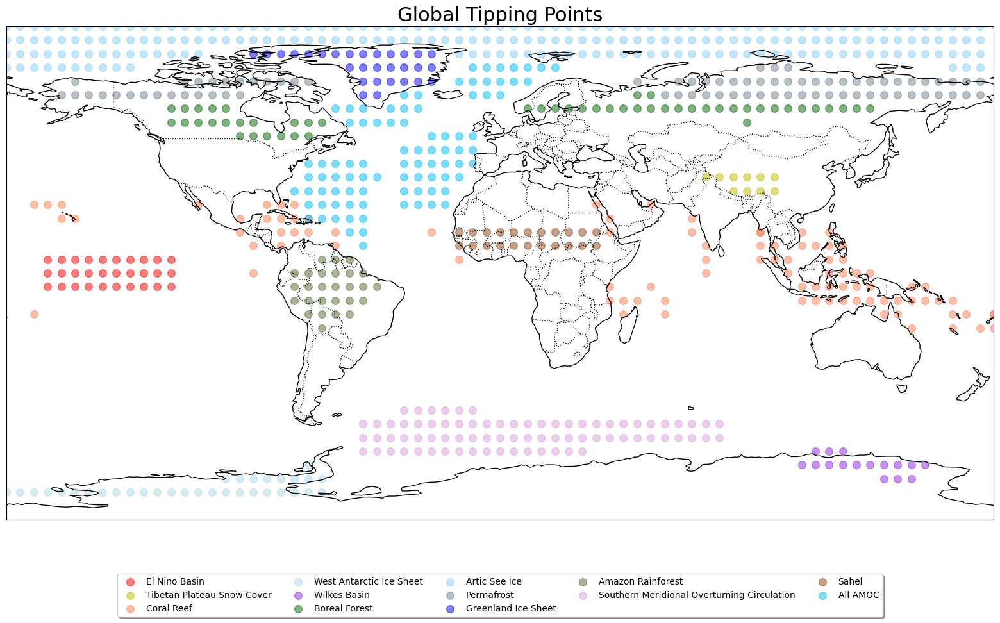

In [184]:
# Inizializzazione della figura e dell'asse con proiezione PlateCarree
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent([-180, 180, -90, 90])

for label, (points, color, legend) in tipping_points.items():
    # Skip specific keys
    if label in ["World", 'AMOC Up', 'AMOC Subpolar Gyre', 'AMOC Gulf', 'AMOC Europe North Africa']:
        continue  # This skips the rest of the loop for these keys
    
    latitudes, longitudes = zip(*points)
    ax.scatter(longitudes, latitudes, color=color, s=70, label=label, alpha=0.5, transform=ccrs.Geodetic())

# Impostazione della legenda esterna all'asse
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=5)

plt.title('Global Tipping Points', fontsize= 22)

    # Save
percorso_file = f'C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\PLOT\\Tipping Points\\tipping_points.pdf'
plt.savefig(percorso_file,bbox_inches='tight',format='pdf')
plt.show()

In [292]:
### CHOOSE THE DATASET

df_loaded = pd.read_csv('C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\temp_tipping_mean_std_values_1970_2022.csv', header=[0, 1], index_col=[0, 1])
decades = [1970, 1980, 1990, 2000, 2010]

#df_loaded = pd.read_csv('C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\temp_tipping_mean_std_values_2022_2100.csv', header=[0, 1], index_col=[0, 1])
#decades = [2022, 2030, 2040, 2050, 2060, 2070, 2080, 2090]





#####  Set Dataframe Index
columns_tuples = list(zip(df_loaded.columns.get_level_values(0), df_loaded.columns.get_level_values(1)))
columns_multiindex = pd.MultiIndex.from_tuples(columns_tuples, names=df_loaded.columns.names)
df_loaded.set_index([df_loaded.index.get_level_values(0), df_loaded.index.get_level_values(1)], inplace=True)
df_loaded.index.names = ['Year', 'Type']

#df_mean = df_loaded.loc[(slice(None), 'mean'), ('El Nino Basin', slice(None))]
df_mean = df_loaded.loc[(slice(None), 'mean'), :]
df_std = df_loaded.loc[(slice(None), 'std'), :]
df_std = df_std.reset_index(level=1, drop=True)
df_mean = df_mean.reset_index(level=1, drop=True)

df_mean.head(10)

El Nino Basin                                         \
     El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
Year                                                        
1970      0.835926  0.274323           0.007378  0.252538   
1971      0.765872  0.020581           0.027003  0.044018   
1972      0.817813  0.035083           0.055659  0.304037   
1973      0.954853  0.184039           0.236716  0.102139   
1974      0.746165  0.011280           0.051705  0.069443   
1975      0.765542  0.042962           0.161572  0.031033   
1976      0.867820  0.041183           0.094544  0.128185   
1977      0.659055  0.015379           0.076152  0.045663   
1978      0.629004  0.037679           0.042036  0.072728   
1979      0.615560  0.014371           0.065140  0.035319   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
Year                                                                  
1970                 0.049600                   0.019064   0.140542   
1971                 0.032265                   0.008243   0.060904   
1972                 0.013851                   0.011563   0.165913   
1973                 0.107090                   0.009473   0.235407   
1974                 0.048187                   0.007028   0.048664   
1975                 0.010292                   0.003377   0.107690   
1976                 0.129902                   0.007595   0.096641   
1977                 0.031025                   0.031490   0.068805   
1978                 0.026429                   0.014033   0.078444   
1979                 0.011731                   0.004790   0.067618   

                                                          ...     All AMOC  \
     West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ... Wilkes Basin   
Year                                                      ...                
1970                 0.033526     0.015797      0.209639  ...     0.001811   
1971                 0.019713     0.013717      0.065928  ...     0.008350   
1972                 0.046692     0.062909      0.094341  ...     0.006657   
1973                 0.374419     0.041433      0.129419  ...     0.008479   
1974                 0.081226     0.014028      0.033418  ...     0.001603   
1975                 0.057249     0.020931      0.094295  ...     0.013895   
1976                 0.016964     0.026980      0.323431  ...     0.005499   
1977                 0.025527     0.018761      0.081656  ...     0.004688   
1978                 0.065514     0.034519      0.058978  ...     0.008882   
1979                 0.050769     0.031616      0.055561  ...     0.011809   

                                                                 \
     Boreal Forest Artic See Ice Permafrost Greenland Ice Sheet   
Year                                                              
1970      0.198037      0.168045   0.133838            0.315887   
1971      0.216381      0.225261   0.165643            0.313239   
1972      0.183528      0.173316   0.136356            0.314320   
1973      0.236079      0.310821   0.152971            0.324139   
1974      0.220517      0.216274   0.131529            0.304099   
1975      0.176288      0.198738   0.132687            0.315361   
1976      0.245996      0.251042   0.174504            0.321394   
1977      0.228129      0.157335   0.154445            0.318602   
1978      0.188513      0.182881   0.137197            0.321033   
1979      0.278149      0.244211   0.193200            0.331681   

                                                                              \
     Amazon Rainforest Southern Meridional Overturning Circulation     Sahel   
Year                                                                           
1970          0.176942                                    0.022331  0.152539   
1971          0.176906                                    0.033724  0.152669   


Dataset of Mean and Std values for the Decades

In [293]:

### Dataset 
#decades = [1970, 1980, 1990, 2000, 2010]  # Esempio di decadi
pairs = list(product(tipping_points.keys(), repeat=2))  # Tuo codice per i pairs
multiindex_columns = pd.MultiIndex.from_tuples(pairs)
anova_mean = pd.DataFrame(index=decades, columns=multiindex_columns)
adjacency_matrix_std = pd.DataFrame(index=decades, columns=multiindex_columns)


# fill dataset
for point1, point2 in pairs:
    for dec in decades:
        start_year = dec
        end_year = dec + 10
        subset = df_loaded.loc[(slice(start_year, end_year-1), slice(None)), (point1, point2)]
        mean_value = subset.xs('mean', level=1).mean()
        print(subset)
        
        # Calcola la deviazione standard combinata per 'std' usando la propagazione degli errori
        # Sostituisci questo con il tuo metodo specifico se necessario
        std_values = subset.xs('std', level=1)
        combined_std = np.sqrt(np.sum(std_values**2)) / len(std_values)
        
        # Assegna i valori calcolati alle matrici di adiacenza
        adjacency_matrix_mean.loc[dec, (point1, point2)] = mean_value
        adjacency_matrix_std.loc[dec, (point1, point2)] = combined_std

# A questo punto, hai 'adjacency_matrix_mean' e 'adjacency_matrix_std' riempite con i valori appropriati.
adjacency_matrix_mean
#adjacency_matrix_std

Year  Type
1970  mean    0.835926
      std     0.011429
1971  mean    0.765872
      std     0.012453
1972  mean    0.817813
      std     0.012421
1973  mean    0.954853
      std     0.004282
1974  mean    0.746165
      std     0.015819
1975  mean    0.765542
      std     0.015773
1976  mean    0.867820
      std     0.011262
1977  mean    0.659055
      std     0.015637
1978  mean    0.629004
      std     0.018434
1979  mean    0.615560
      std     0.015937
Name: (El Nino Basin, El Nino Basin), dtype: float64
Year  Type
1980  mean    0.702218
      std     0.014992
1981  mean    0.684103
      std     0.013966
1982  mean    0.731349
      std     0.013192
1983  mean    0.775165
      std     0.013108
1984  mean    0.590119
      std     0.017266
1985  mean    0.612909
      std     0.016097
1986  mean    0.828240
      std     0.014064
1987  mean    0.620407
      std     0.016923
1988  mean    0.816109
      std     0.015925
1989  mean    0.806525
      std     0.011779
Name:

El Nino Basin                                         \
     El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
1970      0.765761  0.067688           0.081791   0.10851   
1980      0.716714  0.045059           0.068702  0.083319   
1990      0.632444  0.053778            0.03115   0.05158   
2000      0.672932  0.036895            0.04253  0.062581   
2010      0.658947  0.039623           0.031148  0.041609   
2022      0.524111  0.051136           0.160287  0.131283   
2030      0.539302  0.045028           0.160226  0.122296   
2040      0.532659  0.038961            0.17223   0.12413   
2050      0.513902  0.037571           0.189867  0.106854   
2060      0.525422  0.029743           0.177137  0.095488   
2070      0.508853  0.028374           0.167432  0.080594   
2080      0.516391  0.024792            0.16766  0.069908   
2090      0.513714  0.019144           0.158801  0.055363   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
1970                 0.046037                   0.011666   0.107063   
1980                 0.032296                   0.051696   0.082459   
1990                 0.016709                   0.021995   0.083495   
2000                  0.04075                   0.031715   0.075984   
2010                 0.023244                   0.026179   0.070705   
2022                 0.026749                   0.016325   0.078412   
2030                 0.024811                   0.014808   0.081382   
2040                 0.023706                   0.018369   0.080864   
2050                 0.021245                   0.033562    0.07837   
2060                 0.024913                   0.019608   0.080741   
2070                  0.01419                   0.018483    0.07605   
2080                 0.020313                   0.016577   0.076157   
2090                 0.017911                   0.017108   0.075719   

                                                          ...     All AMOC  \
     West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ... Wilkes Basin   
1970                  0.07716     0.028069      0.114667  ...     0.007167   
1980                 0.061508     0.040614       0.09175  ...     0.008676   
1990                 0.047765     0.038531      0.045729  ...     0.009475   
2000                 0.037172     0.037684      0.074496  ...     0.010024   
2010                 0.055907     0.042433      0.059312  ...     0.012333   
2022                 0.027186     0.036808      0.052109  ...     0.001238   
2030                 0.034176     0.031338      0.052165  ...     0.001535   
2040                 0.028815     0.030215      0.054273  ...     0.003218   
2050                 0.029183     0.048845      0.049411  ...      0.00268   
2060                 0.026508     0.033193      0.044222  ...     0.001404   
2070                 0.022268     0.032117      0.036596  ...     0.001878   
2080                 0.020836     0.035319      0.035389  ...     0.002289   
2090                 0.021577     0.024612      0.036914  ...     0.001936   

                                                                 \
     Boreal Forest Artic See Ice Permafrost Greenland Ice Sheet   
1970      0.217161      0.212792   0.151237            0.317976   
1980      0.209915      0.198821   0.147629            0.305217   
1990      0.207981      0.196697   0.143083            0.303346   
2000      0.205054      0.182656   0.143016            0.294863   
2010      0.201498      0.166312   0.132776            0.285615   
2022      0.187108      0.136613   0.153941            0.231424   
2030      0.193612      0.132339   0.152942            0.232571   
2040      0.183127       0.13569   0.149663            0.239794   
2050      0.175178      0.133297   0.142465             0.23134   
2060      0.185895      0.134304   0.137475            0.239265   
2070      0.180165      0.122264   0.136358     

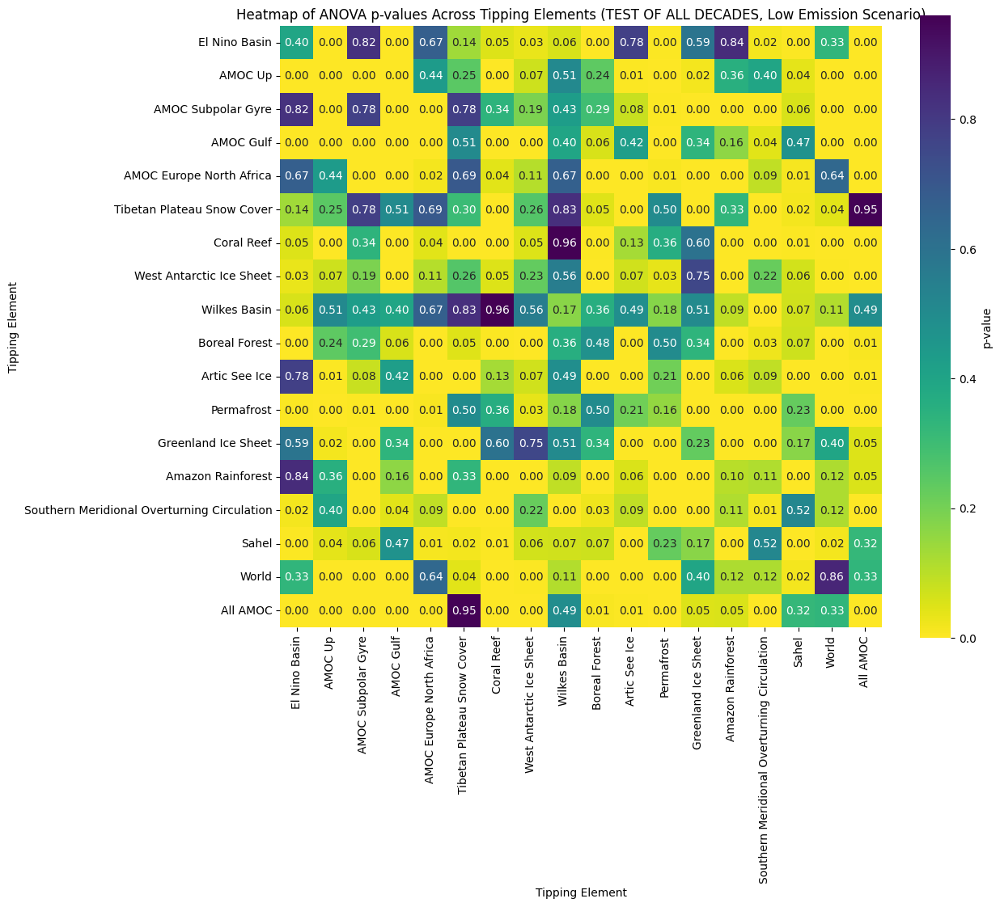

In [317]:
decades_test = [1970,  2010]  #1980, 1990, 2000,                 ##### Choosing the decades on which to perform the ANOVA test!
decades_test = [2020,  2090]

df_loaded = pd.read_csv("X:/temp_tipping_mean_std_values_2022_2100_highemission.csv", header=[0, 1], index_col=[0, 1])
decades_test = [2022, 2030, 2040, 2050, 2060, 2070, 2080, 2090]

pairs = list(product(tipping_points.keys(), repeat=2))
multiindex_columns = pd.MultiIndex.from_tuples(pairs)
pvalues_df = pd.DataFrame(index=tipping_points.keys(), columns=tipping_points.keys())

for point1, point2 in pairs:
    decade_data = {dec: [] for dec in decades_test}
    for dec in decades_test:
        start_year = dec
        end_year = dec + 10
        subset = df_loaded.loc[(slice(start_year, end_year-1), slice(None)), (point1, point2)]
        means = subset.xs('mean', level=1).values
        decade_data[dec].extend(means)

    lists_of_values = [values for values in decade_data.values() if values]
    if len(lists_of_values) > 1: 
        f_stat, p_value = f_oneway(*lists_of_values)
        pvalues_df.at[point1, point2] = p_value
    else:
        print(f"anova test faild for {(point1, point2)}")
        pvalues_df.at[point1, point2] = np.nan  


plt.figure(figsize=(12, 10))
plt.title('Heatmap of ANOVA p-values Across Tipping Elements (TEST OF ALL DECADES, Low Emission Scenario)')
plt.xlabel('Tipping Element')
plt.ylabel('Tipping Element')
#plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()



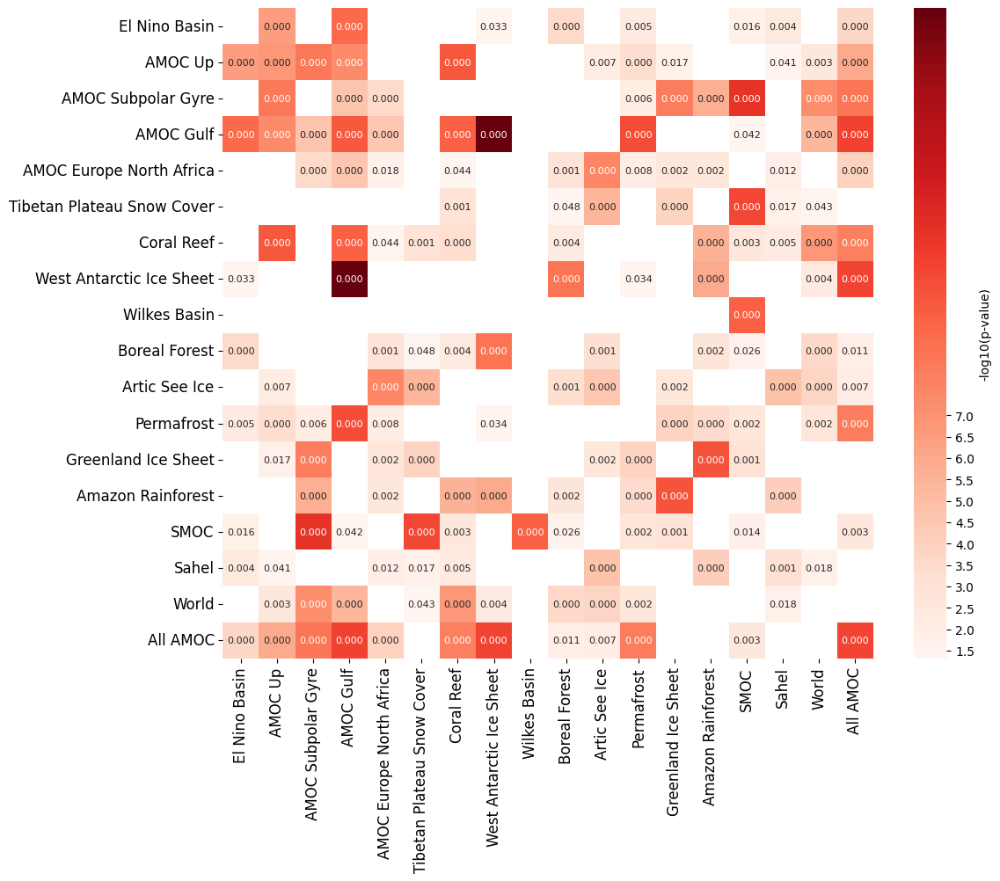

In [315]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway

# ... [your existing code for loading the data and computing p-values] ...

# Transform p-values to -log10(p)
abbreviations = {
    'Southern Meridional Overturning Circulation': 'SMOC',
    # Add other mappings as needed
}

# Transform p-values to -log10(p)
neg_log_pvalues_df = -np.log10(pvalues_df.astype(float))

# Rename index and columns using the abbreviation mapping
neg_log_pvalues_df.rename(index=abbreviations, columns=abbreviations, inplace=True)
pvalues_df.rename(index=abbreviations, columns=abbreviations, inplace=True)

threshold = 1.3

mask_non_significant = neg_log_pvalues_df < threshold

cmap = sns.color_palette("Reds", as_cmap=True)

# Create the heatmap
plt.figure(figsize=(12, 10))
ax = sns.heatmap(neg_log_pvalues_df, mask=mask_non_significant, cmap=cmap, annot=pvalues_df, annot_kws={'size': 8}, fmt=".3f", square=True, 
                 cbar_kws={'label': '-log10(p-value)'})

# Set the colorbar to only show -log10(p) values >= threshold
colorbar = ax.collections[0].colorbar
max_log_value = np.nanmax(neg_log_pvalues_df.values)
ticks = [1.5, 2, min(max_log_value, 2.5), min(max_log_value, 3), min(max_log_value, 3.5), min(max_log_value, 4), min(max_log_value, 4.5), min(max_log_value, 5), min(max_log_value, 5.5), min(max_log_value, 6), min(max_log_value, 6.5), min(max_log_value, 7)]
colorbar.set_ticks(ticks)
colorbar.set_ticklabels([f"{tick:.1f}" for tick in ticks])

# Set titles and labels
#plt.title('Heatmap of Significant ANOVA -log10(p-values) Across Tipping Elements', fontsize=16)
#plt.xlabel('Tipping Element', fontsize=12)
#plt.ylabel('Tipping Element', fontsize=12)
plt.xticks(rotation=90, fontsize=12)
plt.yticks(rotation=0, fontsize=12)
# Save
percorso_file = f'C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\PLOT\\ANOVA20202100.pdf'
plt.savefig(percorso_file,bbox_inches='tight',format='pdf')
plt.tight_layout()  
plt.show()


Tipping Elements Network's features adjacency_matrix ancreation 

In [190]:
pairs = list(product(tipping_points.keys(), repeat=2))
multiindex_columns = pd.MultiIndex.from_tuples(pairs)

adjacency_matrix_mean = pd.DataFrame(index=decades, columns=multiindex_columns)
adjacency_matrix_std = pd.DataFrame(index=decades, columns=multiindex_columns)
adjacency_matrix_pervar = pd.DataFrame(index=decades, columns=multiindex_columns)
adjacency_matrix_pvalue = pd.DataFrame(index=decades, columns=multiindex_columns)
adjacency_matrix_pvalue_std = pd.DataFrame(index=decades, columns=multiindex_columns)
adjacency_matrix_pervar_std = pd.DataFrame(index=decades, columns=multiindex_columns)

subset_1970 = df_loaded.loc[(slice(decades[0], decades[1]-1), 'mean'), :]
subset_1970_std = df_loaded.loc[(slice(decades[0], decades[1]-1), 'std'), :]


 
for dec in decades:
    for point1, point2 in pairs:

        start_year = dec
        end_year = dec + 10
        subset = df_loaded.loc[(slice(start_year, end_year-1), slice(None)), (point1, point2)]

        mean_value = subset.xs('mean', level=1).mean()
        combined_std = subset.xs('std', level=1).mean()
        #combined_std = np.sqrt(np.sum(std_values**2)) / len(std_values)


        adjacency_matrix_mean.loc[dec, (point1, point2)] = mean_value
        adjacency_matrix_std.loc[dec, (point1, point2)] = combined_std

        f_stat, p_value = f_oneway(subset_1970[(point1, point2)], subset.xs('mean', level=1))
        adjacency_matrix_pvalue.loc[dec, (point1, point2)] = p_value

        f_stat, p_value_std = f_oneway(subset_1970_std[(point1, point2)], subset.xs('std', level=1))
        adjacency_matrix_pvalue_std.loc[dec, (point1, point2)] = p_value_std


        #adjacency_matrix_pervar.loc[dec, (point1, point2)] = 0  
        riferimento = adjacency_matrix_mean.loc[decades[0], (point1, point2)]
        variazione_percentuale = ((mean_value - riferimento) / riferimento) * 100
        adjacency_matrix_pervar.loc[dec, (point1, point2)] = variazione_percentuale

        riferimento = adjacency_matrix_std.loc[decades[0], (point1, point2)]
        variazione_percentuale_std = ((combined_std - riferimento) / riferimento) * 100
        adjacency_matrix_pervar_std.loc[dec, (point1, point2)] = variazione_percentuale_std




# Visualizzazione delle matrici
print("Mean Adjacency Matrix:")
print(adjacency_matrix_mean)
print("\nStandard Deviation Adjacency Matrix:")
print(adjacency_matrix_std)
print("\nPercentage Variation Adjacency Matrix:")
subset_1970[(point1, point2)]
adjacency_matrix_pervar

Mean Adjacency Matrix:
     El Nino Basin                                         \
     El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
1970      0.765761  0.067688           0.081791   0.10851   
1980      0.716714  0.045059           0.068702  0.083319   
1990      0.632444  0.053778            0.03115   0.05158   
2000      0.672932  0.036895            0.04253  0.062581   
2010      0.658947  0.039623           0.031148  0.041609   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
1970                 0.046037                   0.011666   0.107063   
1980                 0.032296                   0.051696   0.082459   
1990                 0.016709                   0.021995   0.083495   
2000                  0.04075                   0.031715   0.075984   
2010                 0.023244                   0.026179   0.070705   

                                                   

El Nino Basin                                           \
     El Nino Basin    AMOC Up AMOC Subpolar Gyre  AMOC Gulf   
1970           0.0        0.0                0.0        0.0   
1980     -6.404946 -33.431265         -16.002546 -23.215354   
1990    -17.409733 -20.550145         -61.914527  -52.46512   
2000    -12.122497 -45.491863         -48.001884  -42.32681   
2010    -13.948751 -41.461773         -61.916809 -61.654301   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
1970                      0.0                        0.0        0.0   
1980               -29.847573                 343.148317 -22.980839   
1990               -63.704245                  88.544396 -22.013199   
2000               -11.484372                 171.863066 -29.028288   
2010               -49.510815                 124.408171 -33.959205   

                                                          ...     All AMOC  \
     West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ... Wilkes Basin   
1970                      0.0          0.0           0.0  ...          0.0   
1980               -20.285005    44.690854     -19.98568  ...    21.053241   
1990               -38.096379    37.272699      -60.1201  ...    32.199754   
2000               -51.825195    34.254779     -35.03279  ...     39.85516   
2010               -27.544256    51.171236    -48.274244  ...    72.073821   

                                                                 \
     Boreal Forest Artic See Ice Permafrost Greenland Ice Sheet   
1970           0.0           0.0        0.0                 0.0   
1980     -3.336879     -6.565633  -2.385444           -4.012318   
1990     -4.227466     -7.564083  -5.391476           -4.600851   
2000     -5.575353    -14.162137  -5.435627           -7.268584   
2010     -7.212918    -21.843205 -12.206491          -10.176901   

                                                                               \
     Amazon Rainforest Southern Meridional Overturning Circulation      Sahel   
1970               0.0                                         0.0        0.0   
1980         -3.308465                                    4.400953   9.844603   
1990         -7.813408                                    4.567487  13.503908   
2000         -6.966169                                   -6.258305   8.386998   
2010         -9.421948                                   -22.94614  -4.980854   

                           
          World  All AMOC  
1970        0.0       0.0  
1980  -3.147659 -1.702614  
1990   -7.18093 -2.333615  
2000  -6.707028 -2.215796  
2010 -13.006295 -5.685282  

[5 rows x 324 columns]

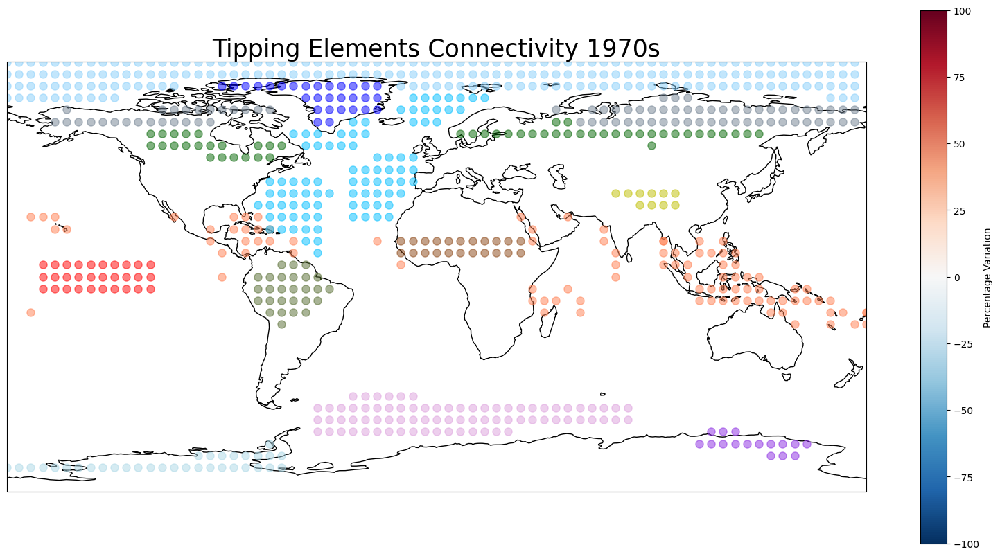

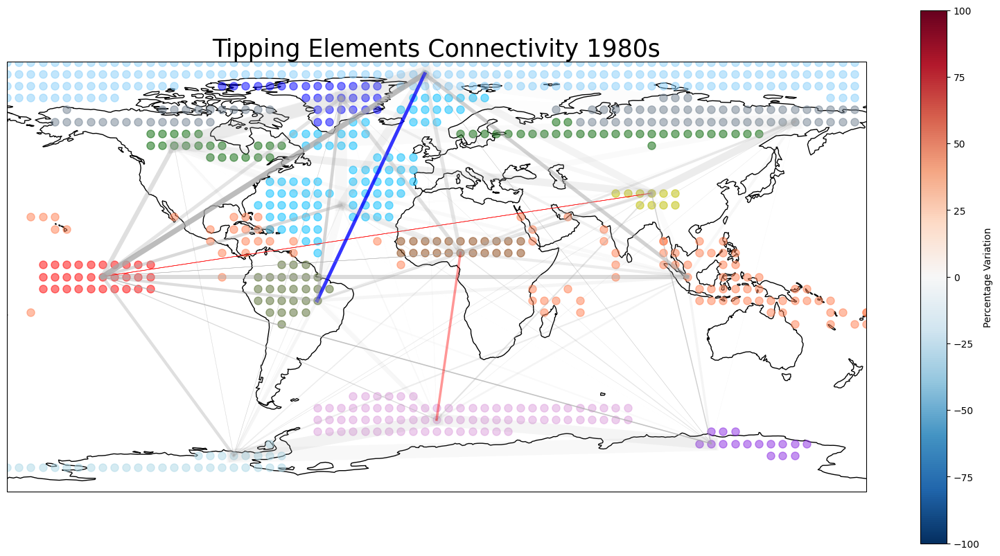

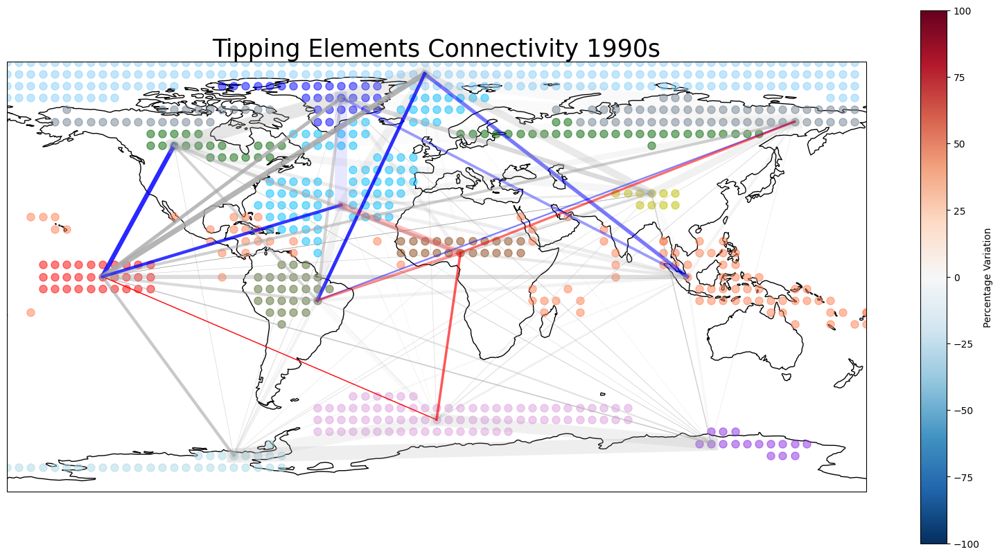

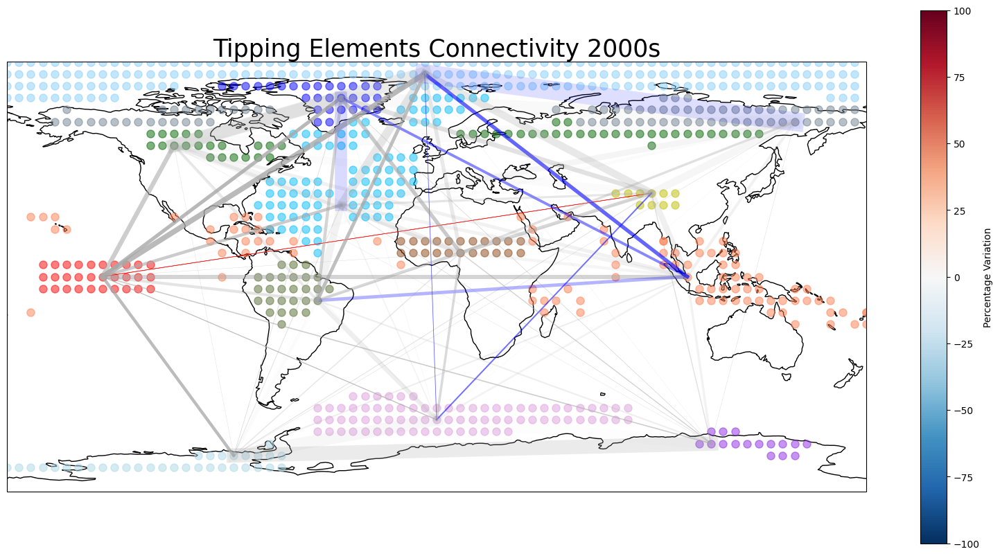

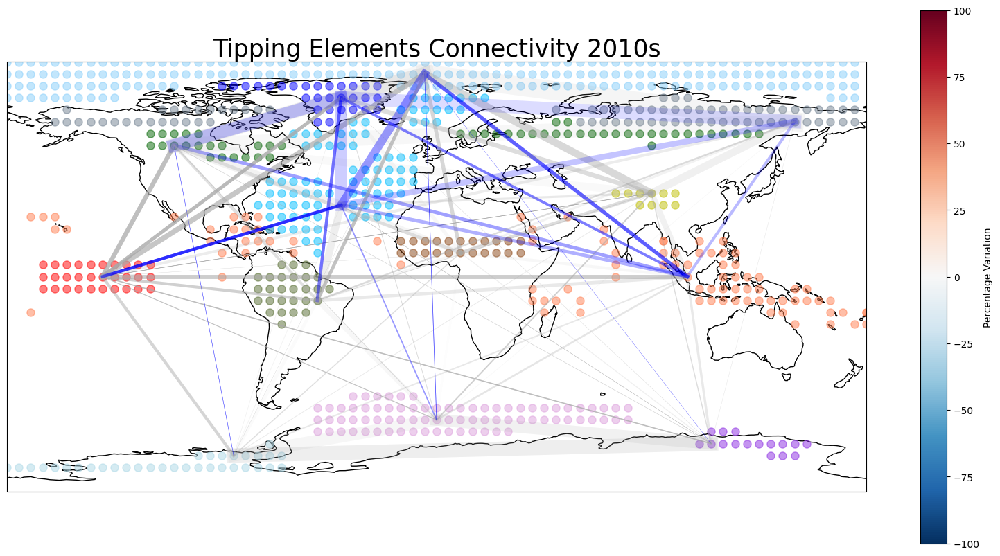

In [191]:
def get_color(value):
    if value > 0:
        return 'red'
    elif value < 0:
        return 'blue'
    else:
        return 'black' 



exclude = ['AMOC Up', 'AMOC Subpolar Gyre', 'AMOC Gulf', 'AMOC Europe North Africa', 'World'] #

for decade in decades:
   
    cmap = plt.cm.RdBu_r
    norm = Normalize(vmin=-100, vmax=100)
    sm = ScalarMappable(norm=norm, cmap=cmap)


    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_global()
    #ax.stock_img()
    ax.coastlines()
    
    tipping_points_decade = {}  
    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            tipping_points_decade[tip] = attrs

    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            nodes = attrs[0]  
            color = attrs[1]  
            for node in nodes:  
                lat, lon = node  
                ax.plot(lon, lat, marker='o', markersize=8, linestyle='None', color=color, alpha=0.5, transform=ccrs.Geodetic())
    

    for point1, point2 in product(tipping_points_decade.keys(), repeat=2):
        lat1, lon1 = tipping_points_decade[point1][2]
        lat2, lon2 = tipping_points_decade[point2][2]
        if point1 != point2 and point1 not in exclude and point2 not in exclude:

            thickness_mean = adjacency_matrix_mean[(point1, point2)][decades[0]]        
            thickness_std = adjacency_matrix_std[(point1, point2)][decade]
            percentage_variation = adjacency_matrix_pervar[(point1, point2)][decade]
            pvalue = adjacency_matrix_pvalue[(point1, point2)][decade]

            color = get_color(percentage_variation)
            transparency = np.abs(percentage_variation) / 100
            transparency = max(0, min(1, transparency))

            num_points = 100
            lon_arc = np.linspace(lon1, lon2, num_points)
            lat_arc = np.linspace(lat1, lat2, num_points)
            
            if pvalue <= 0.05:
                ax.plot(lon_arc, lat_arc, color=color, linewidth=thickness_mean*40, alpha=transparency, transform=ccrs.PlateCarree())
            else:
                ax.plot(lon_arc, lat_arc, color='darkgrey', linewidth=thickness_mean*40, alpha=transparency, transform=ccrs.PlateCarree())


    cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
    cbar.set_label('Percentage Variation')
    ax.set_title("Tipping Elements Connectivity {}s".format(decade), fontsize=25, loc='center')

    # Save
    percorso_file = f'C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\PLOT\\Tipping Points\\tipping_points_connectivity_{decade}.pdf'
    plt.savefig(percorso_file,bbox_inches='tight',format='pdf')
    plt.show()
    plt.close(fig)

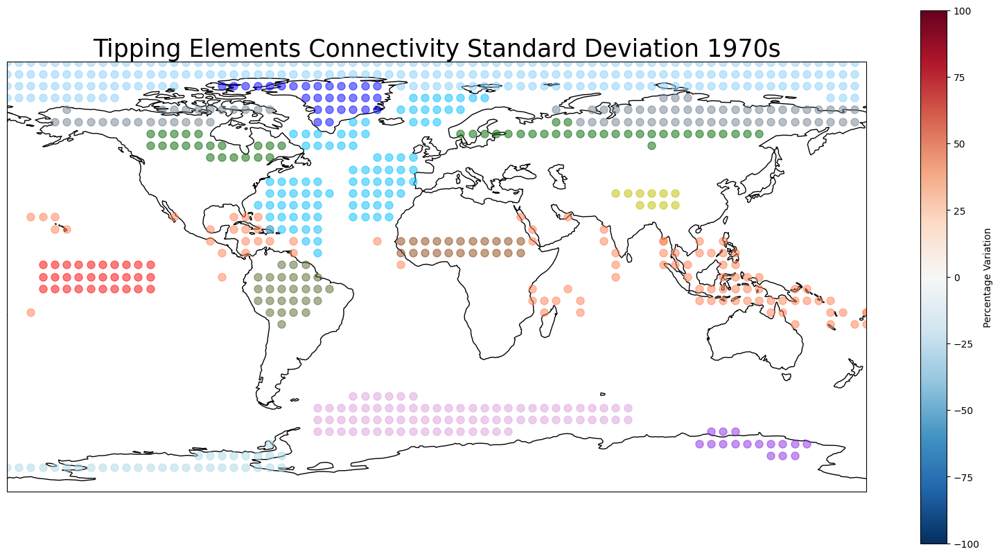

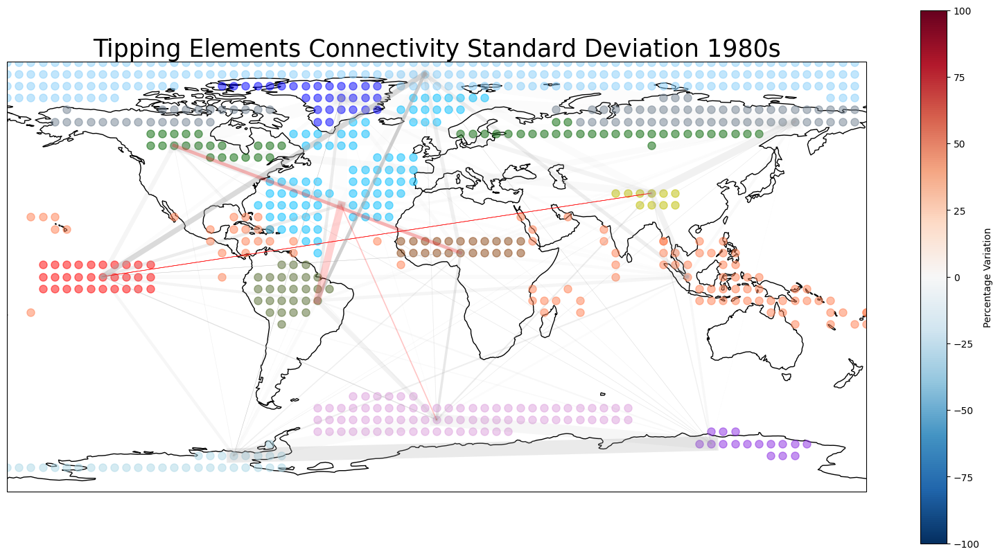

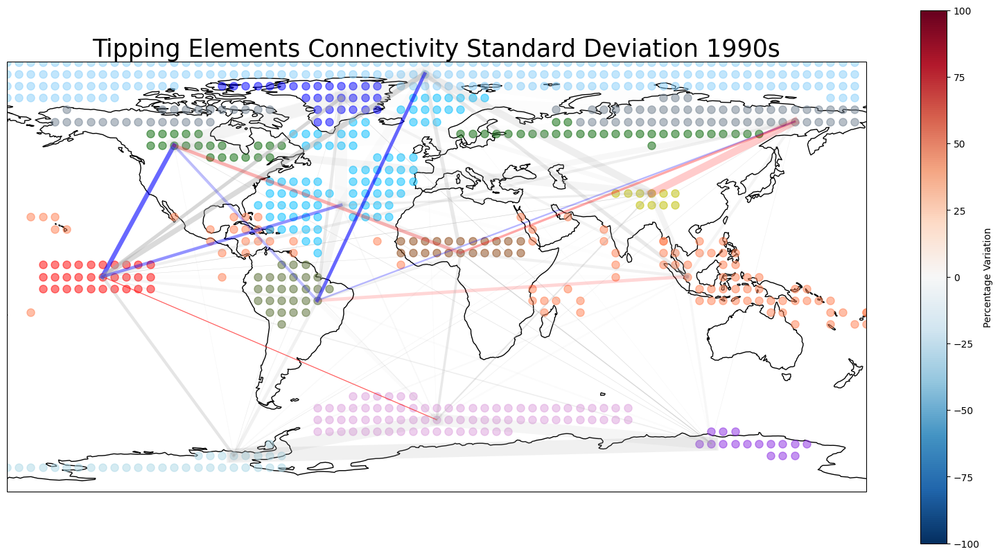

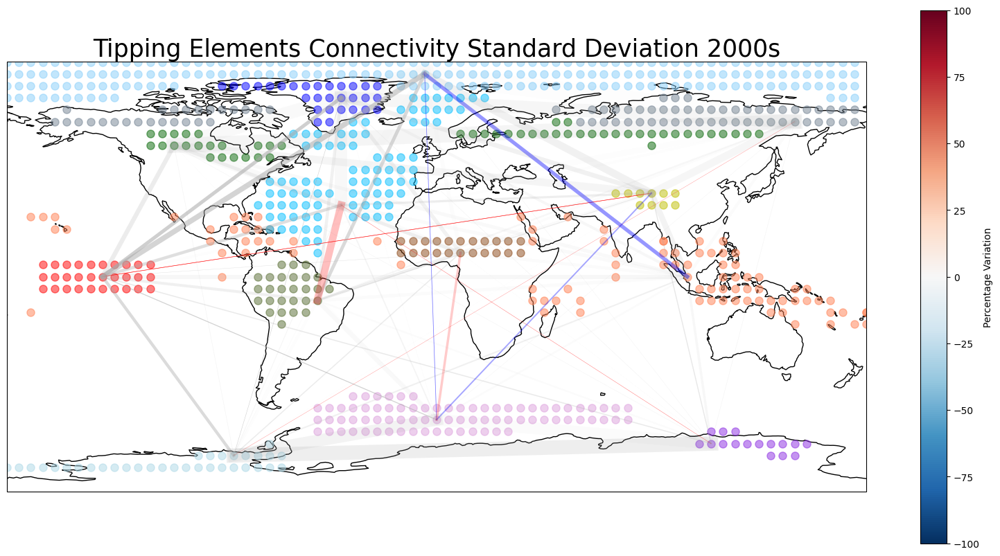

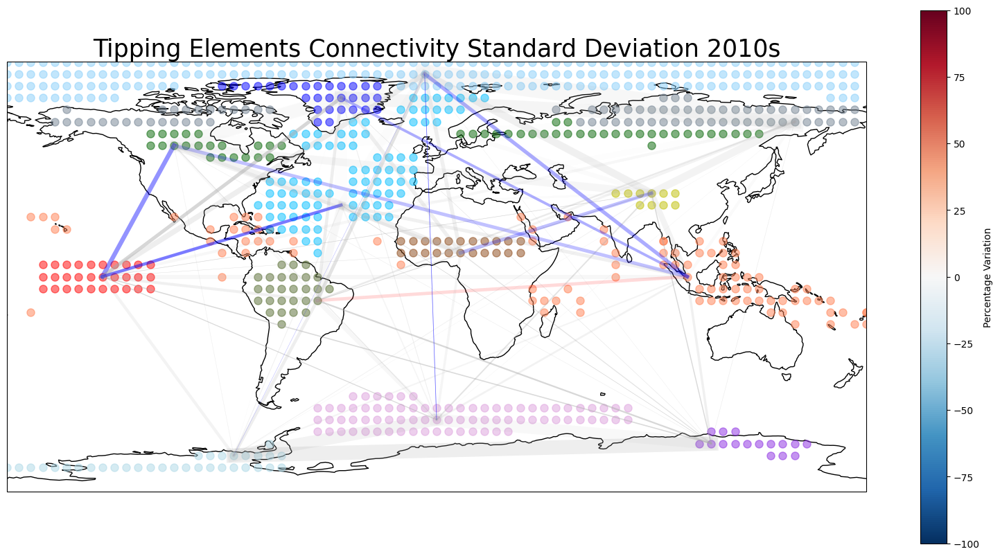

In [200]:

def get_color(value):
    if value > 0:
        return 'red'
    elif value < 0:
        return 'blue'
    else:
        return 'black' 



exclude = ['AMOC Up', 'AMOC Subpolar Gyre', 'AMOC Gulf', 'AMOC Europe North Africa', 'World'] #

for decade in decades:
   
    cmap = plt.cm.RdBu_r
    norm = Normalize(vmin=-100, vmax=100)
    sm = ScalarMappable(norm=norm, cmap=cmap)


    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_global()
    #ax.stock_img()
    ax.coastlines()
    
    tipping_points_decade = {}  
    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            tipping_points_decade[tip] = attrs

    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            nodes = attrs[0]  
            color = attrs[1]  
            for node in nodes:  
                lat, lon = node  
                ax.plot(lon, lat, marker='o', markersize=8, linestyle='None', color=color, alpha=0.5, transform=ccrs.Geodetic())
    

    for point1, point2 in product(tipping_points_decade.keys(), repeat=2):
        lat1, lon1 = tipping_points_decade[point1][2]
        lat2, lon2 = tipping_points_decade[point2][2]
        if point1 != point2 and point1 not in exclude and point2 not in exclude:

            thickness_mean = adjacency_matrix_mean[(point1, point2)][decades[0]]        
            thickness_std = adjacency_matrix_std[(point1, point2)][decade]
            percentage_variation = adjacency_matrix_pervar_std[(point1, point2)][decade]
            pvalue = adjacency_matrix_pvalue_std[(point1, point2)][decade]

            color = get_color(percentage_variation)
            transparency = np.abs(percentage_variation) / 100
            transparency = max(0, min(1, transparency))

            num_points = 100
            lon_arc = np.linspace(lon1, lon2, num_points)
            lat_arc = np.linspace(lat1, lat2, num_points)
            
            if pvalue <= 0.05:
                ax.plot(lon_arc, lat_arc, color=color, linewidth=thickness_mean*40, alpha=transparency*1.45, transform=ccrs.PlateCarree())
            else:
                ax.plot(lon_arc, lat_arc, color='darkgrey', linewidth=thickness_mean*40, alpha=transparency*1.45, transform=ccrs.PlateCarree())


    cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
    cbar.set_label('Percentage Variation')
    ax.set_title("Tipping Elements Connectivity Standard Deviation {}s".format(decade), fontsize=25, loc='center')

    # Save
    percorso_file = f'C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\PLOT\\Tipping Points\\tipping_points_std_{decade}.pdf'
    plt.savefig(percorso_file,bbox_inches='tight',format='pdf')
    plt.show()
    plt.close(fig)

In [ ]:
df_loaded_CMIP6 = pd.read_csv("X:/temp_tipping_mean_std_values_2022_2100_highemission.csv", header=[0, 1], index_col=[0, 1])

df_loaded_CMIP6.head()

In [268]:
df_loaded_CMIP6 = pd.read_csv("X:/temp_tipping_mean_std_values_2022_2100_highemission.csv", header=[0, 1], index_col=[0, 1])

df_loaded_CMIP6.head()

El Nino Basin                                         \
          El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
2022 mean      0.491720  0.097013           0.200630  0.170078   
     std       0.016943  0.009261           0.012268  0.007807   
2023 mean      0.524473  0.027095           0.118643  0.082879   
     std       0.021325  0.005752           0.009365  0.007085   
2024 mean      0.524728  0.066876           0.137899  0.095008   

                                                                          \
          AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
2022 mean                 0.014619                   0.025278   0.079707   
     std                  0.003817                   0.004714   0.004465   
2023 mean                 0.020618                   0.002614   0.071970   
     std                  0.003869                   0.003236   0.003965   
2024 mean                 0.050514                   0.015518   0.084545   

                                                               ...  \
          West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ...   
2022 mean                 0.028920     0.039487      0.048560  ...   
     std                  0.005391     0.006511      0.004738  ...   
2023 mean                 0.034372     0.018571      0.043577  ...   
     std                  0.004200     0.006030      0.004012  ...   
2024 mean                 0.047554     0.039996      0.056634  ...   

              All AMOC                                         \
          Wilkes Basin Boreal Forest Artic See Ice Permafrost   
2022 mean     0.001545      0.169380      0.140164   0.166637   
     std      0.001041      0.004931      0.002533   0.003119   
2023 mean     0.000498      0.174493      0.111354   0.116384   
     std      0.000665      0.004839      0.002565   0.003088   
2024 mean     0.001501      0.183160      0.126357   0.147111   

                                                 \
          Greenland Ice Sheet Amazon Rainforest   
2022 mean            0.231471          0.166327   
     std             0.007168          0.007045   
2023 mean            0.229590          0.189959   
     std             0.008665          0.008220   
2024 mean            0.229249          0.225445   

                                                                           \
          Southern Meridional Overturning Circulation     Sahel     World   
2022 mean                                    0.007432  0.124249  0.087377   
     std                                     0.001089  0.006982  0.000557   
2023 mean                                    0.015845  0.109891  0.084492   
     std                                     0.001030  0.006489  0.000537   
2024 mean                                    0.009118  0.124675  0.088854   

                     
           All AMOC  
2022 mean  0.336738  
     std   0.007436  
2023 mean  0.344794  
     std   0.007606  
2024 mean  0.334989  

[5 rows x 324 columns]

In [279]:
#df_loaded_CMIP6 = pd.read_csv('C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\temp_tipping_mean_std_values_2022_2100.csv', header=[0, 1], index_col=[0, 1])
df_loaded_CMIP6 = pd.read_csv("X:/temp_tipping_mean_std_values_2022_2100_lowemission.csv", header=[0, 1], index_col=[0, 1])
decades_CMIP6 = [2022, 2030, 2040, 2050, 2060, 2070, 2080, 2090]


pairs = list(product(tipping_points.keys(), repeat=2))
multiindex_columns = pd.MultiIndex.from_tuples(pairs)

adjacency_matrix_mean_CMIP6 = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_std_CMIP6 = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_pervar_CMIP6 = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_pvalue_CMIP6 = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_pvalue_CMIP6_std = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_pervar_CMIP6_std = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)

subset_2022 = df_loaded_CMIP6.loc[(slice(decades_CMIP6[0], decades_CMIP6[1]-1), 'mean'), :]
subset_2022_std = df_loaded_CMIP6.loc[(slice(decades_CMIP6[0], decades_CMIP6[1]-1), 'std'), :]


for dec in decades_CMIP6:
    for point1, point2 in pairs:

        start_year = dec
        end_year = dec + 10
        subset = df_loaded_CMIP6.loc[(slice(start_year, end_year-1), slice(None)), (point1, point2)]

        mean_value = subset.xs('mean', level=1).mean()
        std_values = subset.xs('std', level=1)
        combined_std = np.sqrt(np.sum(std_values**2)) / len(std_values)
        combined_std = subset.xs('std', level=1).mean()

        adjacency_matrix_mean_CMIP6.loc[dec, (point1, point2)]  = mean_value
        adjacency_matrix_std_CMIP6.loc[dec, (point1, point2)] = combined_std

        f_stat, p_value = f_oneway(subset_1970[(point1, point2)], subset.xs('mean', level=1))
        adjacency_matrix_pvalue_CMIP6.loc[dec, (point1, point2)] = p_value

        f_stat, p_value_std = f_oneway(subset_2022_std[(point1, point2)], subset.xs('std', level=1))
        adjacency_matrix_pvalue_CMIP6_std.loc[dec, (point1, point2)] = p_value_std


        #adjacency_matrix_pervar.loc[dec, (point1, point2)] = 0  
        riferimento = adjacency_matrix_mean_CMIP6.loc[decades_CMIP6[0], (point1, point2)]
        variazione_percentuale = ((mean_value - riferimento) / riferimento) * 100
        adjacency_matrix_pervar_CMIP6.loc[dec, (point1, point2)] = variazione_percentuale

        riferimento = adjacency_matrix_std_CMIP6.loc[decades_CMIP6[0], (point1, point2)]
        variazione_percentuale_std = ((combined_std - riferimento) / riferimento) * 100
        adjacency_matrix_pervar_CMIP6_std.loc[dec, (point1, point2)] = variazione_percentuale_std


# Visualizzazione delle matrici
print("Mean Adjacency Matrix:")
print(adjacency_matrix_mean_CMIP6)
print("\nStandard Deviation Adjacency Matrix:")
print(adjacency_matrix_std_CMIP6)
print("\nPercentage Variation Adjacency Matrix:")
adjacency_matrix_pervar_CMIP6

Mean Adjacency Matrix:
     El Nino Basin                                         \
     El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
2022      0.556898  0.048868           0.167366    0.1334   
2030      0.544388  0.037524           0.173917  0.132662   
2040      0.525481  0.037319           0.165126  0.118956   
2050      0.523391  0.041959           0.160801  0.119389   
2060      0.515325  0.043732            0.17571  0.119059   
2070      0.523268  0.040688           0.181613  0.120947   
2080      0.526917  0.033761           0.153552  0.119361   
2090      0.530656  0.039892           0.176832   0.11636   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
2022                 0.020258                   0.011579   0.082713   
2030                 0.018865                   0.031248   0.082591   
2040                   0.0182                   0.017048   0.079876   
2050       

El Nino Basin                                           \
     El Nino Basin    AMOC Up AMOC Subpolar Gyre  AMOC Gulf   
2022           0.0        0.0                0.0        0.0   
2030     -2.246357 -23.213396           3.914534  -0.552926   
2040     -5.641396 -23.632972          -1.338231  -10.82745   
2050     -6.016765 -14.138715           -3.92234 -10.502432   
2060     -7.465114 -10.510057           4.985807 -10.750003   
2070     -6.038738 -16.738528            8.51252  -9.334622   
2080     -5.383621 -30.914496          -8.253892 -10.523644   
2090     -4.712147 -18.367938           5.655913 -12.773613   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
2022                      0.0                        0.0        0.0   
2030                -6.875527                 169.857929  -0.146722   
2040               -10.159666                  47.222742  -3.429375   
2050                -6.061665                  91.935727  -4.335796   
2060                -4.999282                 161.377706  -8.895855   
2070               -16.669991                 107.507113  -4.486117   
2080               -10.518791                  24.293898    -5.0272   
2090               -11.926788                   89.80752  -3.586124   

                                                          ...     All AMOC  \
     West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ... Wilkes Basin   
2022                      0.0          0.0           0.0  ...          0.0   
2030                 7.248881    49.546772    -12.951335  ...    43.311136   
2040               -22.132326     -3.86257    -11.131254  ...   -12.399079   
2050               -29.603668    24.531849    -24.103264  ...    53.498829   
2060               -28.475455    44.226069    -11.963463  ...    47.029517   
2070               -36.606225    15.622089    -20.559776  ...    17.214108   
2080               -26.140896    13.384111    -10.050385  ...     -1.54921   
2090               -15.152052    12.472552    -21.065871  ...    50.508501   

                                                                 \
     Boreal Forest Artic See Ice Permafrost Greenland Ice Sheet   
2022           0.0           0.0        0.0                 0.0   
2030      0.351524      0.194116  -2.304783            -0.93453   
2040     -3.599973      6.574056   4.007523           -2.595573   
2050      -0.53844     -0.521562  -5.714138             -2.5698   
2060      1.535742      3.647302   1.340995           -2.489861   
2070      0.428774     -7.182646  -3.997766           -1.297938   
2080      0.204244      0.642737   1.872623           -1.553492   
2090       6.48784     -2.338645  -3.714704           -5.026962   

                                                                               \
     Amazon Rainforest Southern Meridional Overturning Circulation      Sahel   
2022               0.0                                         0.0        0.0   
2030          -4.79612                                    8.095951   5.155712   
2040          4.223495                                  -11.012035   4.437782   
2050         -3.599385                                   14.225101    5.59149   
2060         -8.846593                                   13.653651   1.180975   
2070         -2.127797                                   13.871931   3.980157   
2080         -0.196194                                    8.480582  11.625273   
2090         -4.032258                                     31.3021  10.893883   

                          
         World  All AMOC  
2022       0.0       0.0  
2030 -1.002278  1.022556  
2040  0.179366  1.245802  
2050 -1.414142  1.127285  
2060 -0.315512  2.026747  
2070 -1.206216  2.658251  
2080 -0.944459  1.667519  
2090 -1.194751  1.966503  

[8 rows x 324 columns]

El Nino Basin                                         \
     El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
2022      0.556898  0.048868           0.167366    0.1334   
2030      0.544388  0.037524           0.173917  0.132662   
2040      0.525481  0.037319           0.165126  0.118956   
2050      0.523391  0.041959           0.160801  0.119389   
2060      0.515325  0.043732            0.17571  0.119059   
2070      0.523268  0.040688           0.181613  0.120947   
2080      0.526917  0.033761           0.153552  0.119361   
2090      0.530656  0.039892           0.176832   0.11636   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
2022                 0.020258                   0.011579   0.082713   
2030                 0.018865                   0.031248   0.082591   
2040                   0.0182                   0.017048   0.079876   
2050                  0.01903                   0.022225   0.079127   
2060                 0.019245                   0.030266   0.075355   
2070                 0.016881                   0.024028   0.079002   
2080                 0.018127                   0.014393   0.078555   
2090                 0.017842                   0.021979   0.079747   

                                                          ...     All AMOC  \
     West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ... Wilkes Basin   
2022                 0.043338     0.036013      0.059998  ...     0.001844   
2030                  0.04648     0.053856      0.052227  ...     0.002642   
2040                 0.033746     0.034622      0.053319  ...     0.001615   
2050                 0.030508     0.044847      0.045536  ...      0.00283   
2060                 0.030997     0.051939       0.05282  ...     0.002711   
2070                 0.027474     0.041638      0.047662  ...     0.002161   
2080                 0.032009     0.040832      0.053968  ...     0.001815   
2090                 0.036771     0.040504      0.047359  ...     0.002775   

                                                                 \
     Boreal Forest Artic See Ice Permafrost Greenland Ice Sheet   
2022      0.169961      0.124245   0.137644            0.234208   
2030      0.170558      0.124486   0.134472            0.232019   
2040      0.163842      0.132412    0.14316            0.228129   
2050      0.169046      0.123597   0.129779            0.228189   
2060      0.172571      0.128776    0.13949            0.228376   
2070       0.17069       0.11532   0.132141            0.231168   
2080      0.170308      0.125043   0.140222            0.230569   
2090      0.180988      0.121339   0.132531            0.222434   

                                                                              \
     Amazon Rainforest Southern Meridional Overturning Circulation     Sahel   
2022          0.174603                                    0.008123  0.118677   
2030          0.166228                                    0.008781  0.124796   
2040          0.181977                                    0.007229  0.123944   
2050          0.168318                                    0.009279  0.125313   
2060          0.159156                                    0.009232  0.120079   
2070          0.170887                                     0.00925  0.123401   
2080           0.17426                                    0.008812  0.132474   
2090          0.167562                                    0.010666  0.131606   

                          
         World  All AMOC  
2022  0.085591  0.339221  
2030  0.084733  0.342689  
2040  0.085745  0.343447  
2050  0.084381  0.343045  
2060  0.085321  0.346096  
2070  0.084559  0.348238  
2080  0.084783  0.344877  
2090  0.084569  0.345891  

[8 rows x 324 columns]

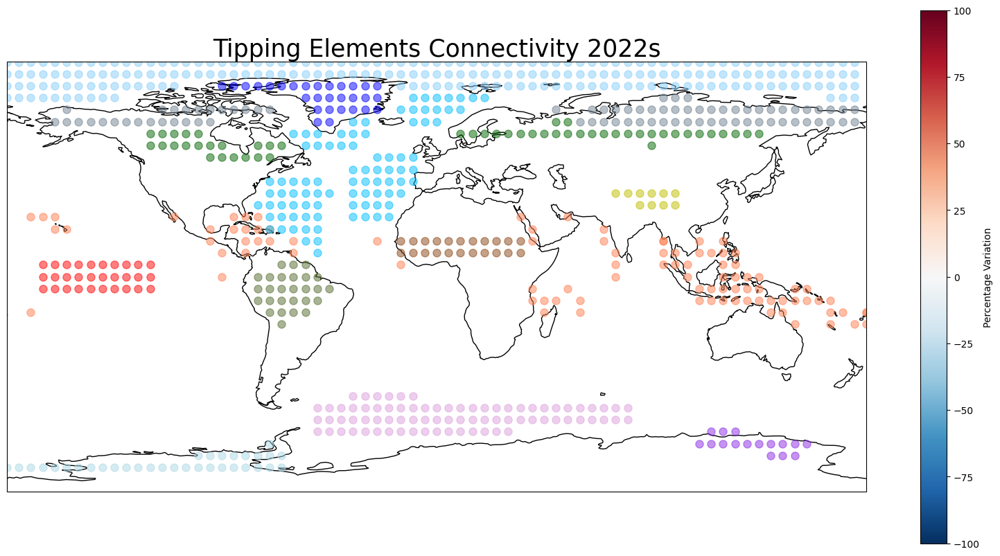

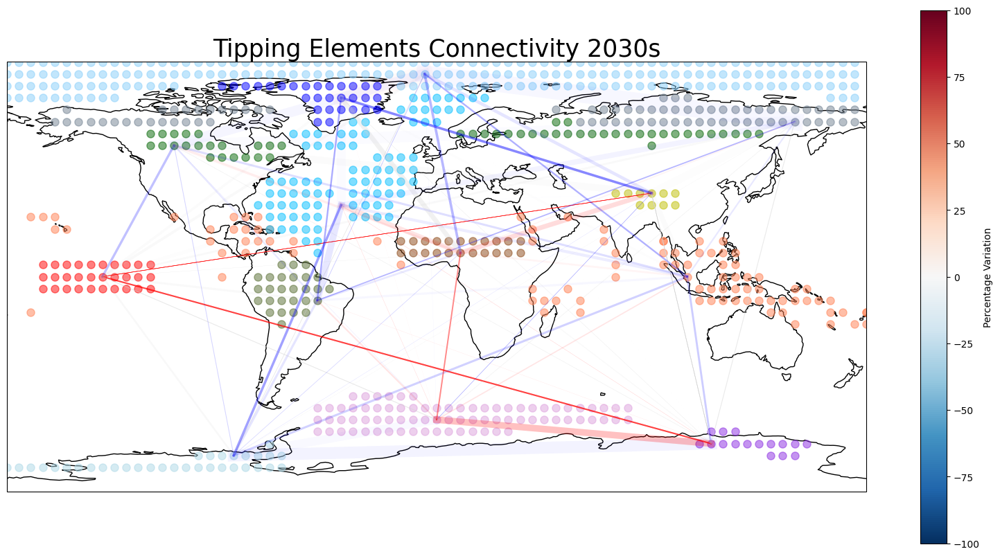

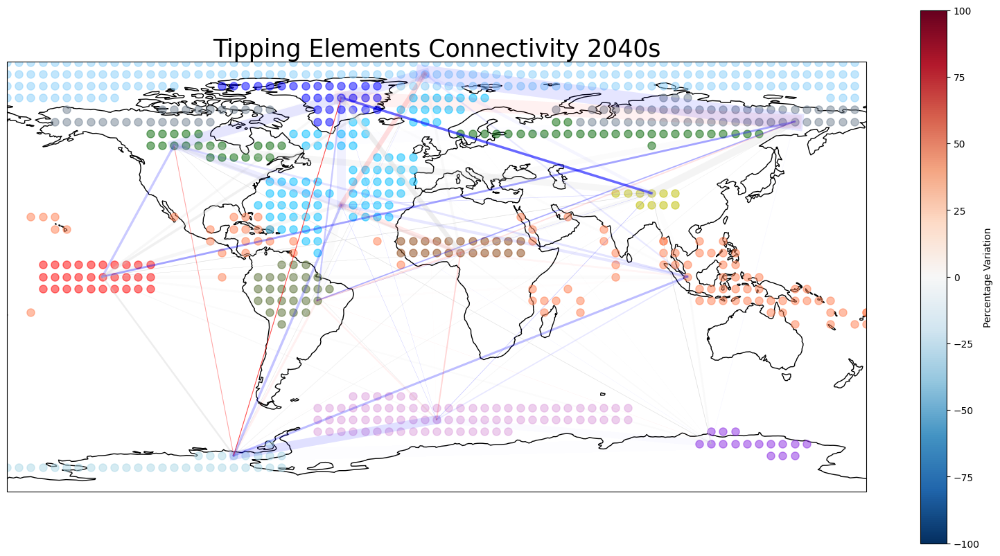

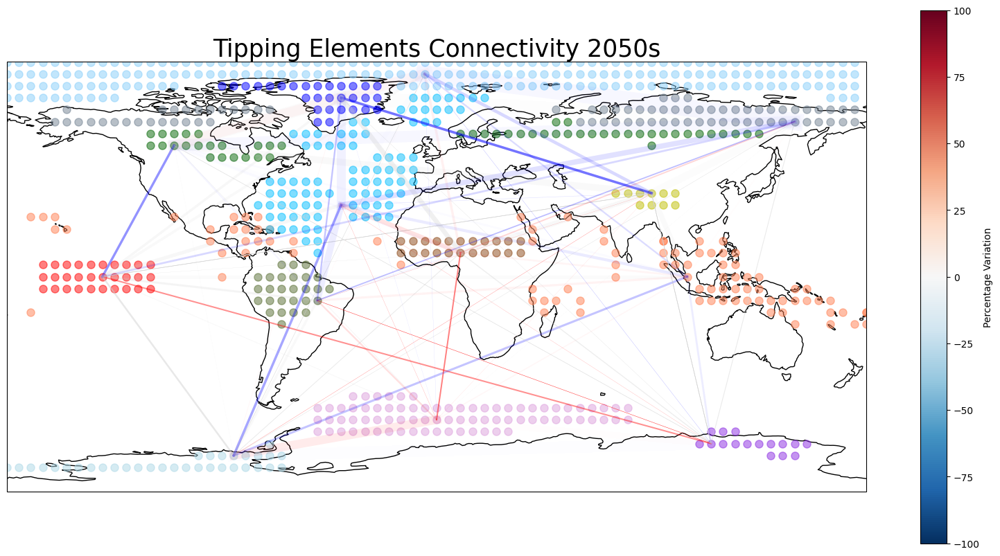

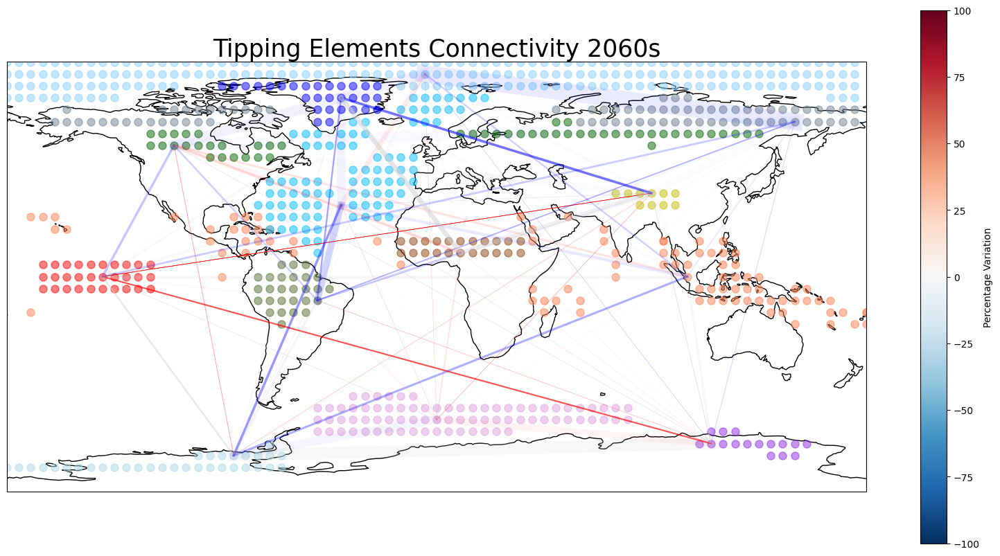

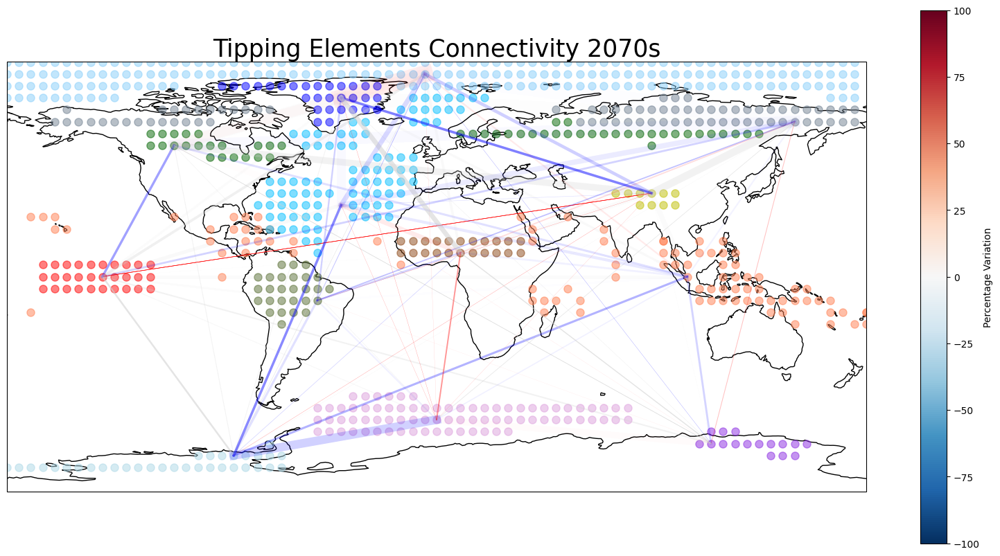

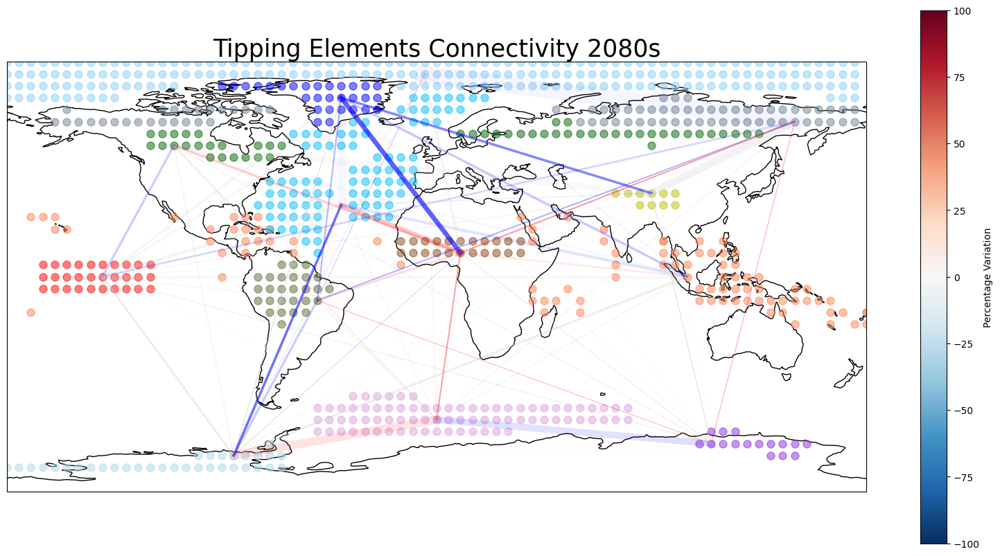

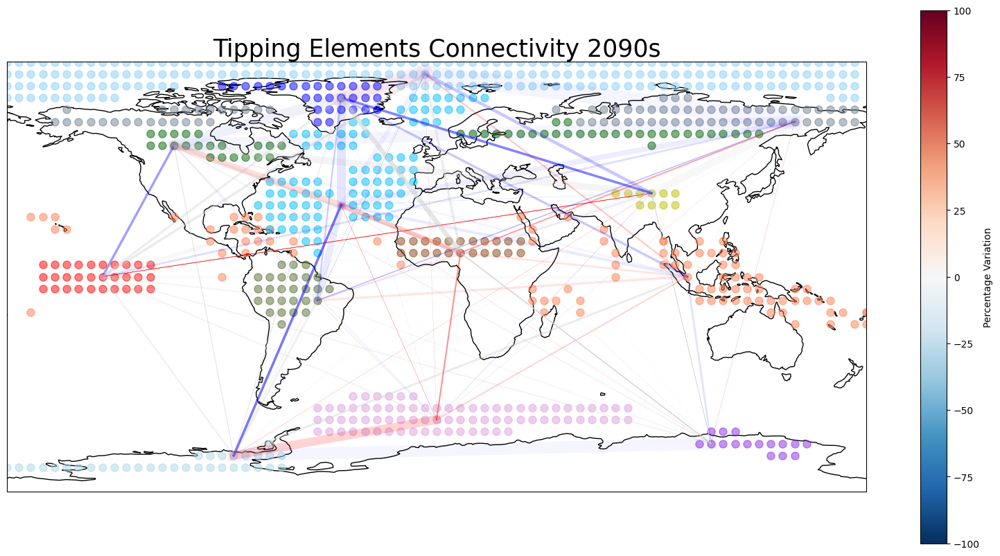

In [280]:

def get_color(value):
    if value > 0:
        return 'red'
    elif value < 0:
        return 'blue'
    else:
        return 'black' 



exclude = ['AMOC Up', 'AMOC Subpolar Gyre', 'AMOC Gulf', 'AMOC Europe North Africa', 'World'] #

for decade in decades_CMIP6:
   
    cmap = plt.cm.RdBu_r
    norm = Normalize(vmin=-100, vmax=100)
    sm = ScalarMappable(norm=norm, cmap=cmap)


    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_global()
    #ax.stock_img()
    ax.coastlines()
    
    tipping_points_decade = {}  
    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            tipping_points_decade[tip] = attrs

    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            nodes = attrs[0]  
            color = attrs[1]  
            for node in nodes:  
                lat, lon = node  
                ax.plot(lon, lat, marker='o', markersize=8, linestyle='None', color=color, alpha=0.5, transform=ccrs.Geodetic())
    

    for point1, point2 in product(tipping_points_decade.keys(), repeat=2):
        lat1, lon1 = tipping_points_decade[point1][2]
        lat2, lon2 = tipping_points_decade[point2][2]
        if point1 != point2 and point1 not in exclude and point2 not in exclude:

            thickness_mean = adjacency_matrix_mean_CMIP6[(point1, point2)][decades_CMIP6[0]]        
            thickness_std = adjacency_matrix_std_CMIP6[(point1, point2)][decade]
            percentage_variation = adjacency_matrix_pervar_CMIP6[(point1, point2)][decade]
            pvalue = adjacency_matrix_pvalue_CMIP6[(point1, point2)][decade]

            color = get_color(percentage_variation)
            transparency = np.abs(percentage_variation) / 100
            transparency = max(0, min(1, transparency))

            num_points = 100
            lon_arc = np.linspace(lon1, lon2, num_points)
            lat_arc = np.linspace(lat1, lat2, num_points)
            
            if pvalue <= 0.05:
                ax.plot(lon_arc, lat_arc, color=color, linewidth=thickness_mean*40, alpha=transparency, transform=ccrs.PlateCarree())
            else:
                ax.plot(lon_arc, lat_arc, color='lightgrey', linewidth=thickness_mean*40, alpha=transparency, transform=ccrs.PlateCarree())


    cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
    cbar.set_label('Percentage Variation')
    ax.set_title("Tipping Elements Connectivity {}s".format(decade), fontsize=25, loc='center')

    # Save
    #percorso_file = f'C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\PLOT\\Tipping Points\\tipping_points_connectivity_{decade}.pdf'
    #plt.savefig(percorso_file,bbox_inches='tight',format='pdf')
    plt.show()
    plt.close(fig)

In [286]:
adjacency_matrix_mean_CMIP6.iloc[0]

El Nino Basin  El Nino Basin                                  0.556898
               AMOC Up                                        0.048868
               AMOC Subpolar Gyre                             0.167366
               AMOC Gulf                                        0.1334
               AMOC Europe North Africa                       0.020258
                                                                ...   
All AMOC       Amazon Rainforest                              0.174603
               Southern Meridional Overturning Circulation    0.008123
               Sahel                                          0.118677
               World                                          0.085591
               All AMOC                                       0.339221
Name: 2022, Length: 324, dtype: object

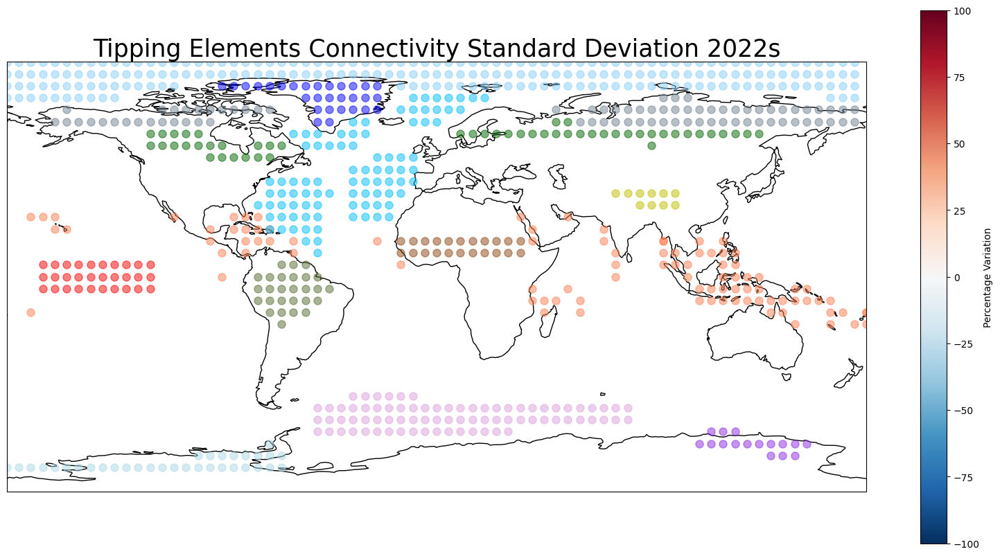

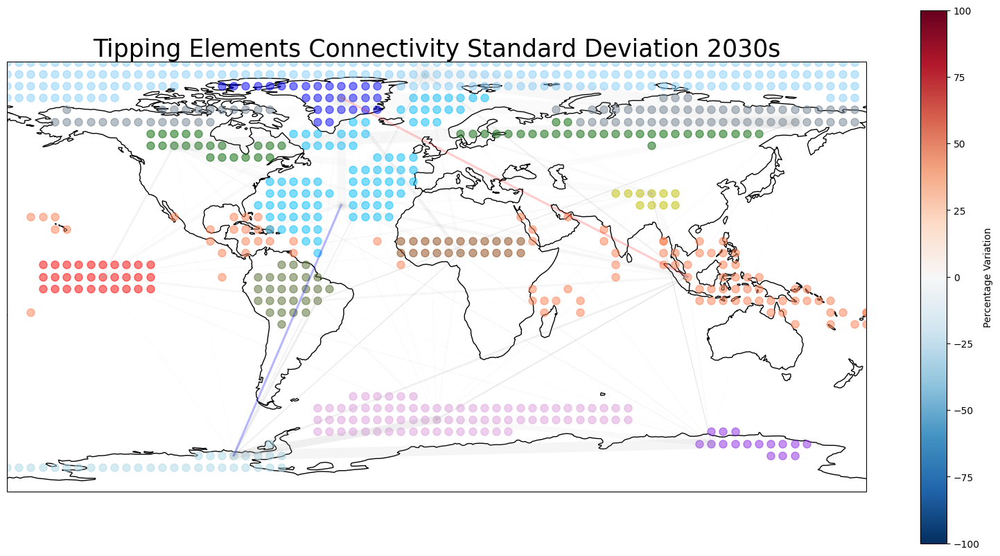

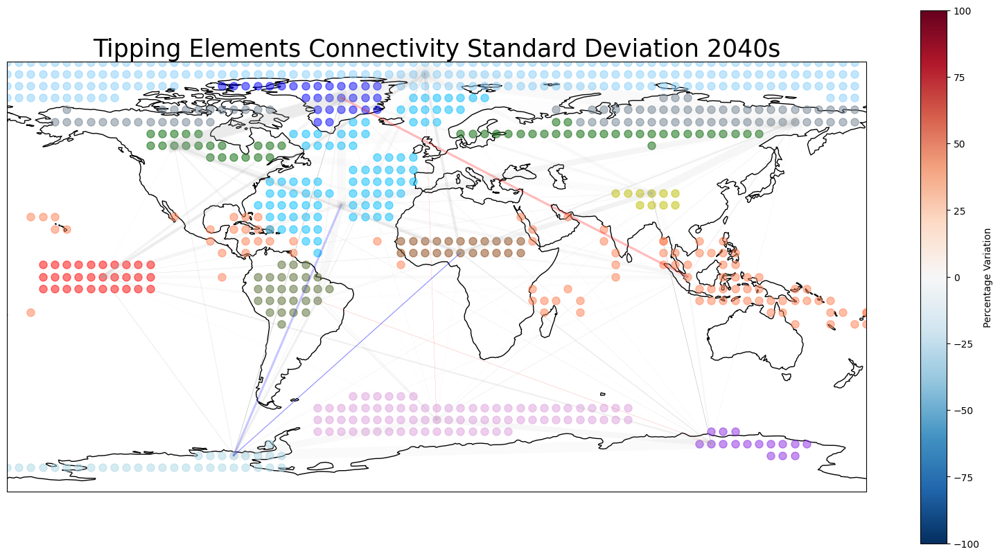

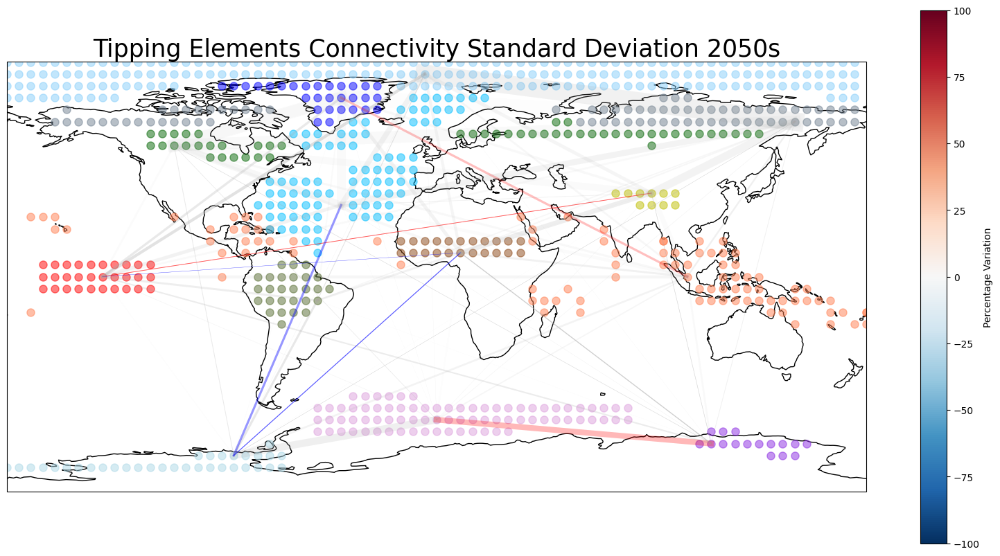

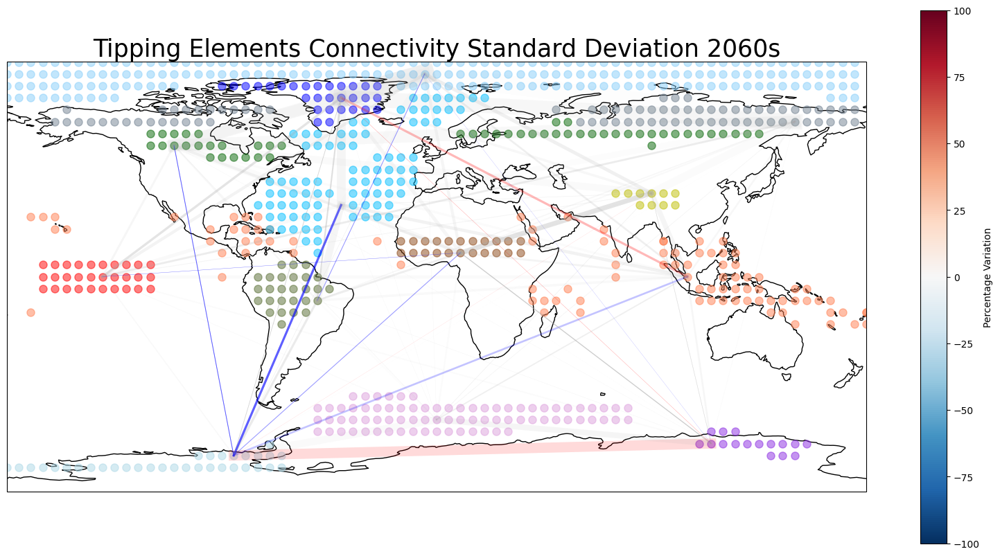

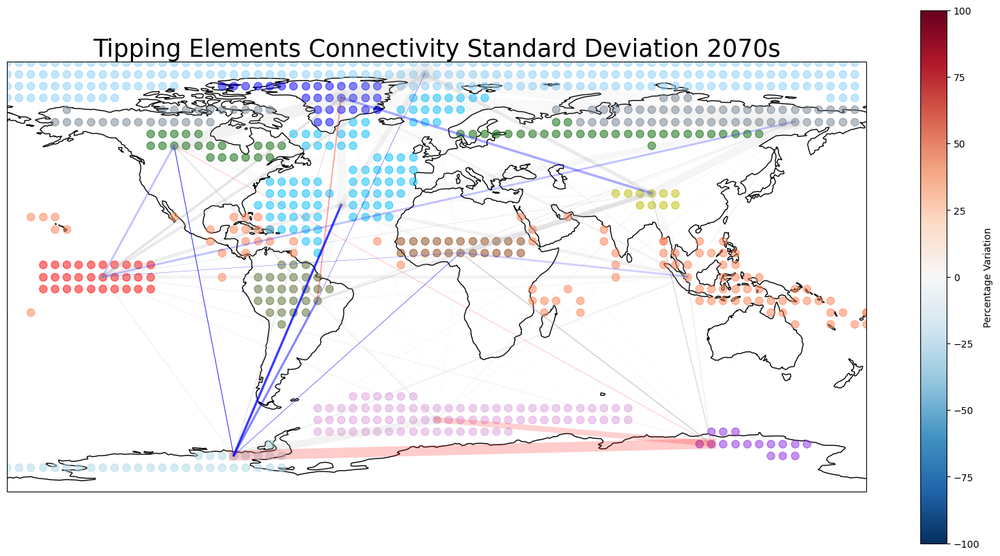

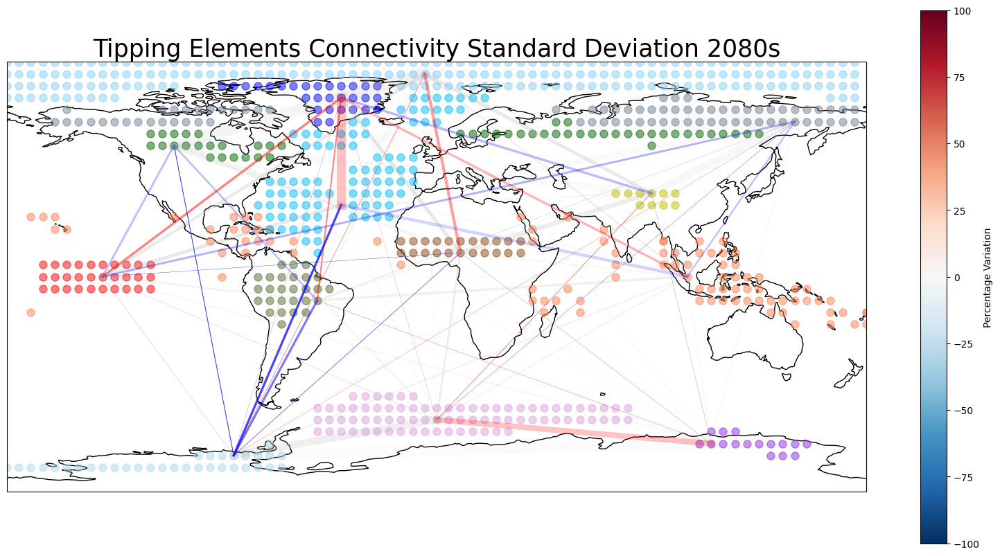

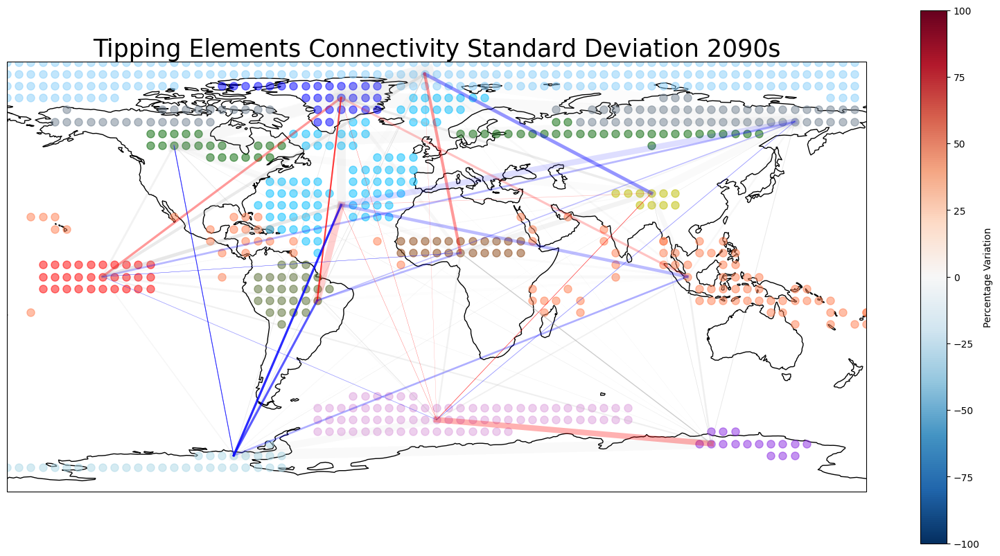

In [217]:
def get_color(value):
    if value > 0:
        return 'red'
    elif value < 0:
        return 'blue'
    else:
        return 'black' 



exclude = ['AMOC Up', 'AMOC Subpolar Gyre', 'AMOC Gulf', 'AMOC Europe North Africa', 'World'] #

for decade in decades_CMIP6:
   
    cmap = plt.cm.RdBu_r
    norm = Normalize(vmin=-100, vmax=100)
    sm = ScalarMappable(norm=norm, cmap=cmap)


    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_global()
    #ax.stock_img()
    ax.coastlines()
    
    tipping_points_decade = {}  
    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            tipping_points_decade[tip] = attrs

    for tip, attrs in tipping_points.items():
        if tip not in exclude:
            nodes = attrs[0]  
            color = attrs[1]  
            for node in nodes:  
                lat, lon = node  
                ax.plot(lon, lat, marker='o', markersize=8, linestyle='None', color=color, alpha=0.5, transform=ccrs.Geodetic())
    

    for point1, point2 in product(tipping_points_decade.keys(), repeat=2):
        lat1, lon1 = tipping_points_decade[point1][2]
        lat2, lon2 = tipping_points_decade[point2][2]
        if point1 != point2 and point1 not in exclude and point2 not in exclude:

            thickness_mean = adjacency_matrix_mean_CMIP6[(point1, point2)][decades_CMIP6[0]]        
            thickness_std = adjacency_matrix_std_CMIP6[(point1, point2)][decade]
            percentage_variation = adjacency_matrix_pervar_CMIP6_std[(point1, point2)][decade]
            pvalue = adjacency_matrix_pvalue_CMIP6_std[(point1, point2)][decade]

            color = get_color(percentage_variation)
            transparency = np.abs(percentage_variation) / 100
            transparency = max(0, min(1, transparency))

            num_points = 100
            lon_arc = np.linspace(lon1, lon2, num_points)
            lat_arc = np.linspace(lat1, lat2, num_points)
            
            if pvalue <= 0.05:
                ax.plot(lon_arc, lat_arc, color=color, linewidth=thickness_mean*40, alpha=transparency*1.45, transform=ccrs.PlateCarree())
            else:
                ax.plot(lon_arc, lat_arc, color='darkgrey', linewidth=thickness_mean*40, alpha=transparency*1.45, transform=ccrs.PlateCarree())


    cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
    cbar.set_label('Percentage Variation')
    ax.set_title("Tipping Elements Connectivity Standard Deviation {}s".format(decade), fontsize=25, loc='center')

    # Save
    percorso_file = f'C:\\Users\\David\\OneDrive\\Desktop\\CLIMATE_NETWORK\\Paper\\PLOT\\Tipping Points\\tipping_points_std_{decade}.pdf'
    plt.savefig(percorso_file,bbox_inches='tight',format='pdf')
    plt.show()
    plt.close(fig)

In [304]:
adjacency_matrix_mean

El Nino Basin                                         \
     El Nino Basin   AMOC Up AMOC Subpolar Gyre AMOC Gulf   
1970      0.765761  0.067688           0.081791   0.10851   
1980      0.716714  0.045059           0.068702  0.083319   
1990      0.632444  0.053778            0.03115   0.05158   
2000      0.672932  0.036895            0.04253  0.062581   
2010      0.658947  0.039623           0.031148  0.041609   
2022      0.524111  0.051136           0.160287  0.131283   
2030      0.539302  0.045028           0.160226  0.122296   
2040      0.532659  0.038961            0.17223   0.12413   
2050      0.513902  0.037571           0.189867  0.106854   
2060      0.525422  0.029743           0.177137  0.095488   
2070      0.508853  0.028374           0.167432  0.080594   
2080      0.516391  0.024792            0.16766  0.069908   
2090      0.513714  0.019144           0.158801  0.055363   

                                                                     \
     AMOC Europe North Africa Tibetan Plateau Snow Cover Coral Reef   
1970                 0.046037                   0.011666   0.107063   
1980                 0.032296                   0.051696   0.082459   
1990                 0.016709                   0.021995   0.083495   
2000                  0.04075                   0.031715   0.075984   
2010                 0.023244                   0.026179   0.070705   
2022                 0.026749                   0.016325   0.078412   
2030                 0.024811                   0.014808   0.081382   
2040                 0.023706                   0.018369   0.080864   
2050                 0.021245                   0.033562    0.07837   
2060                 0.024913                   0.019608   0.080741   
2070                  0.01419                   0.018483    0.07605   
2080                 0.020313                   0.016577   0.076157   
2090                 0.017911                   0.017108   0.075719   

                                                          ...     All AMOC  \
     West Antarctic Ice Sheet Wilkes Basin Boreal Forest  ... Wilkes Basin   
1970                  0.07716     0.028069      0.114667  ...     0.007167   
1980                 0.061508     0.040614       0.09175  ...     0.008676   
1990                 0.047765     0.038531      0.045729  ...     0.009475   
2000                 0.037172     0.037684      0.074496  ...     0.010024   
2010                 0.055907     0.042433      0.059312  ...     0.012333   
2022                 0.027186     0.036808      0.052109  ...     0.001238   
2030                 0.034176     0.031338      0.052165  ...     0.001535   
2040                 0.028815     0.030215      0.054273  ...     0.003218   
2050                 0.029183     0.048845      0.049411  ...      0.00268   
2060                 0.026508     0.033193      0.044222  ...     0.001404   
2070                 0.022268     0.032117      0.036596  ...     0.001878   
2080                 0.020836     0.035319      0.035389  ...     0.002289   
2090                 0.021577     0.024612      0.036914  ...     0.001936   

                                                                 \
     Boreal Forest Artic See Ice Permafrost Greenland Ice Sheet   
1970      0.217161      0.212792   0.151237            0.317976   
1980      0.209915      0.198821   0.147629            0.305217   
1990      0.207981      0.196697   0.143083            0.303346   
2000      0.205054      0.182656   0.143016            0.294863   
2010      0.201498      0.166312   0.132776            0.285615   
2022      0.187108      0.136613   0.153941            0.231424   
2030      0.193612      0.132339   0.152942            0.232571   
2040      0.183127       0.13569   0.149663            0.239794   
2050      0.175178      0.133297   0.142465             0.23134   
2060      0.185895      0.134304   0.137475            0.239265   
2070      0.180165      0.122264   0.136358     

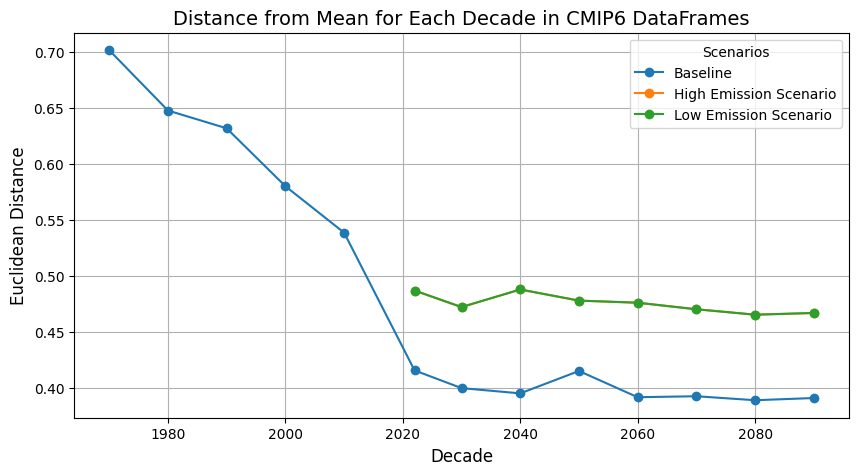

In [303]:
decades_CMIP6 = [2022, 2030, 2040, 2050, 2060, 2070, 2080, 2090]
pairs = list(product(tipping_points.keys(), repeat=2))
multiindex_columns = pd.MultiIndex.from_tuples(pairs)


df_loaded_CMIP6_low = pd.read_csv("X:/temp_tipping_mean_std_values_2022_2100_lowemission.csv", header=[0, 1], index_col=[0, 1])
adjacency_matrix_mean_CMIP6_low = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_std_CMIP6_low = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)

df_loaded_CMIP6_high = pd.read_csv("X:/temp_tipping_mean_std_values_2022_2100_lowemission.csv", header=[0, 1], index_col=[0, 1])
adjacency_matrix_mean_CMIP6_high = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)
adjacency_matrix_std_CMIP6_high = pd.DataFrame(index=decades_CMIP6, columns=multiindex_columns)


for dec in decades_CMIP6:
    for point1, point2 in pairs:

        start_year = dec
        end_year = dec + 10

        subset = df_loaded_CMIP6_low.loc[(slice(start_year, end_year-1), slice(None)), (point1, point2)]
        mean_value = subset.xs('mean', level=1).mean()
        std_values = subset.xs('std', level=1)
        combined_std = np.sqrt(np.sum(std_values**2)) / len(std_values)
        combined_std = subset.xs('std', level=1).mean()

        adjacency_matrix_mean_CMIP6_low.loc[dec, (point1, point2)]  = mean_value
        adjacency_matrix_std_CMIP6_low.loc[dec, (point1, point2)] = combined_std

        subset = df_loaded_CMIP6_high.loc[(slice(start_year, end_year-1), slice(None)), (point1, point2)]
        mean_value = subset.xs('mean', level=1).mean()
        std_values = subset.xs('std', level=1)
        combined_std = np.sqrt(np.sum(std_values**2)) / len(std_values)
        combined_std = subset.xs('std', level=1).mean()

        adjacency_matrix_mean_CMIP6_high.loc[dec, (point1, point2)]  = mean_value
        adjacency_matrix_std_CMIP6_high.loc[dec, (point1, point2)] = combined_std


import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean

# Assume 'df_loaded_CMIP6' is your DataFrame already loaded
# Calculate the reference row as the mean of all rows along the column axis
reference_row = adjacency_matrix_mean.mean(axis=0)
#reference_row = adjacency_matrix_mean.iloc[2]

# Calculate the Euclidean distances from the mean vector for each dataframe
distances = adjacency_matrix_mean.apply(lambda row: euclidean(reference_row, row), axis=1)
distances1 = adjacency_matrix_mean_CMIP6_high.apply(lambda row: euclidean(reference_row, row), axis=1)
distances2 = adjacency_matrix_mean_CMIP6_low.apply(lambda row: euclidean(reference_row, row), axis=1)

# Create a line plot of the distances
plt.figure(figsize=(10, 5))
plt.plot(distances.index, distances, marker='o', linestyle='-', label='Baseline')
plt.plot(distances1.index, distances1, marker='o', linestyle='-', label='High Emission Scenario')
plt.plot(distances2.index, distances2, marker='o', linestyle='-', label='Low Emission Scenario')

plt.title('Distance from Mean for Each Decade in CMIP6 DataFrames', fontsize=14)  # Bigger font size for the title
plt.xlabel('Decade', fontsize=12)  # Bigger font size for x-axis label
plt.ylabel('Euclidean Distance', fontsize=12)  # Bigger font size for y-axis label
plt.grid(True)

# Add a legend
plt.legend(title='Scenarios')

plt.show()
